# WELCOME!

Welcome to "***Employee Churn Analysis Project***". This is the second project of Capstone Project Series, which you will be able to build your own classification models for a variety of business settings. 

Also you will research what is Employee Churn?, How it is different from customer churn, Exploratory data analysis and visualization of employee churn dataset using ***matplotlib*** and ***seaborn***, model building and evaluation using python ***scikit-learn*** and ***Tensorflow-Keras*** packages. 

You will be able to implement classification techniques in Python. Using Scikit-Learn allowing you to successfully make predictions with Distance Based, Bagging, Boosting algorithms for this project. On the other hand, for Deep Learning you will use Tensorflow-Keras. 

At the end of the project, you will have the opportunity to deploy your model using *Streamlit*.

Before diving into the project, please take a look at the determines and project structure.

- NOTE: This project assumes that you already know the basics of coding in Python and are familiar with model deployement as well as the theory behind Distance Based, Bagging, Boosting algorithms, and Confusion Matrices. You can try more models and methods beside these to improve your model metrics.



# #Determines
In this project you have HR data of a company. A study is requested from you to predict which employee will churn by using this data.

The HR dataset has 14,999 samples. In the given dataset, you have two types of employee one who stayed and another who left the company.

You can describe 10 attributes in detail as:
- ***satisfaction_level:*** It is employee satisfaction point, which ranges from 0-1.
- ***last_evaluation:*** It is evaluated performance by the employer, which also ranges from 0-1.
- ***number_projects:*** How many of projects assigned to an employee?
- ***average_monthly_hours:*** How many hours in averega an employee worked in a month?
- **time_spent_company:** time_spent_company means employee experience. The number of years spent by an employee in the company.
- ***work_accident:*** Whether an employee has had a work accident or not.
- ***promotion_last_5years:*** Whether an employee has had a promotion in the last 5 years or not.
- ***Departments:*** Employee's working department/division.
- ***Salary:*** Salary level of the employee such as low, medium and high.
- ***left:*** Whether the employee has left the company or not.

First of all, to observe the structure of the data, outliers, missing values and features that affect the target variable, you must use exploratory data analysis and data visualization techniques. 

Then, you must perform data pre-processing operations such as ***Scaling*** and ***Encoding*** to increase the accuracy score of Gradient Descent Based or Distance-Based algorithms. you are asked to perform ***Cluster Analysis*** based on the information you obtain during exploratory data analysis and data visualization processes. 

The purpose of clustering analysis is to cluster data with similar characteristics. You are asked to use the ***K-means*** algorithm to make cluster analysis. However, you must provide the K-means algorithm with information about the number of clusters it will make predictions. Also, the data you apply to the K-means algorithm must be scaled. In order to find the optimal number of clusters, you are asked to use the ***Elbow method***. Briefly, try to predict the set to which individuals are related by using K-means and evaluate the estimation results.

Once the data is ready to be applied to the model, you must ***split the data into train and test***. Then build a model to predict whether employees will churn or not. Train your models with your train set, test the success of your model with your test set. 

Try to make your predictions by using the algorithms ***Logistic Regression***, ***Random Forest Classifier***, ***XGBoost Classifier***, ***ANN***. You can use the related modules of the ***scikit-learn*** and ***Tensorflow-Keras*** library. You can use scikit-learn ***Classification Metrics*** module for accuracy calculation. You can use the ***Yellowbrick*** module for model selection and visualization.

In the final step, you will deploy your model using Streamlit tool.



# #Tasks

#### 1. Exploratory Data Analysis
- Importing Modules
- Loading Dataset
- Data Insigts

#### 2. Data Visualization
- Employees Left
- Determine Number of Projects
- Determine Time Spent in Company
- Subplots of Features

#### 3. Data Pre-Processing
- Scaling
- Label Encoding

#### 4. Cluster Analysis
- Find the optimal number of clusters (k) using the elbow method for for K-means.
- Determine the clusters by using K-Means then Evaluate predicted results.

#### 5. Model Building
- Split Data as Train and Test set
- Built Distance Based and Evaluate Model Performance and Predict Test Data
- Built Random Forest Classifier and Evaluate Model Performance and Predict Test Data
- Built XGBoost Classifier, Evaluate Model Performance and Predict Test Data
- Built ANN Classifier, Evaluate Model Performance and Predict Test Data

#### 6. Model Deployement

- Save and Export the Best Model
- Save and Export Variables
- Deploy best model via Streamlit

## 1. Exploratory Data Analysis

Exploratory Data Analysis is an initial process of analysis, in which you can summarize characteristics of data such as pattern, trends, outliers, and hypothesis testing using descriptive statistics and visualization.

### Importing Modules

In [195]:
import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
%matplotlib inline
import statsmodels.api as sm
import statsmodels.formula.api as smf
import missingno as msno 

from sklearn.compose import make_column_transformer

# Scaling
from sklearn.preprocessing import scale 
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures 
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import PowerTransformer 
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler
from sklearn.metrics import DistanceMetric 

from sklearn.metrics import classification_report, confusion_matrix, log_loss, recall_score, accuracy_score, precision_score, f1_score, plot_confusion_matrix, roc_auc_score
from sklearn.metrics import make_scorer, average_precision_score

# Importing plotly and cufflinks in offline mode
import cufflinks as cf
import plotly.offline
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

# Ignore Warnings
import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

# Figure&Display options
plt.rcParams["figure.figsize"] = (10,6)
pd.set_option('max_colwidth',200)
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_columns', 200)
pd.set_option('display.float_format', lambda x: '%.3f' % x)

# makes strings colored
import colorama
from colorama import Fore, Style
from termcolor import colored

import ipywidgets
from ipywidgets import interact

# White grid plots for dark mode users
sns.set_style("whitegrid")

### Loading Dataset

Let's first load the required HR dataset using pandas's "read_csv" function.

In [2]:
df = pd.read_csv("HR_Dataset.csv")
df

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years,Departments,salary
0,0.380,0.530,2,157,3,0,1,0,sales,low
1,0.800,0.860,5,262,6,0,1,0,sales,medium
2,0.110,0.880,7,272,4,0,1,0,sales,medium
3,0.720,0.870,5,223,5,0,1,0,sales,low
4,0.370,0.520,2,159,3,0,1,0,sales,low
...,...,...,...,...,...,...,...,...,...,...
14994,0.400,0.570,2,151,3,0,1,0,support,low
14995,0.370,0.480,2,160,3,0,1,0,support,low
14996,0.370,0.530,2,143,3,0,1,0,support,low
14997,0.110,0.960,6,280,4,0,1,0,support,low


### Data Insights

In the given dataset, you have two types of employee one who stayed and another who left the company. So, you can divide data into two groups and compare their characteristics. Moreover, you can find the average of both the groups using groupby() and mean() function.

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14999 entries, 0 to 14998
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   satisfaction_level     14999 non-null  float64
 1   last_evaluation        14999 non-null  float64
 2   number_project         14999 non-null  int64  
 3   average_montly_hours   14999 non-null  int64  
 4   time_spend_company     14999 non-null  int64  
 5   Work_accident          14999 non-null  int64  
 6   left                   14999 non-null  int64  
 7   promotion_last_5years  14999 non-null  int64  
 8   Departments            14999 non-null  object 
 9   salary                 14999 non-null  object 
dtypes: float64(2), int64(6), object(2)
memory usage: 1.1+ MB


In [4]:
df.describe()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years
count,14999.000,14999.000,14999.000,14999.000,14999.000,14999.000,14999.000,14999.000
mean,0.613,0.716,3.803,201.050,3.498,0.145,0.238,0.021
std,0.249,0.171,1.233,49.943,1.460,0.352,0.426,0.144
min,0.090,0.360,2.000,96.000,2.000,0.000,0.000,0.000
25%,0.440,0.560,3.000,156.000,3.000,0.000,0.000,0.000
50%,0.640,0.720,4.000,200.000,3.000,0.000,0.000,0.000
75%,0.820,0.870,5.000,245.000,4.000,0.000,0.000,0.000
max,1.000,1.000,7.000,310.000,10.000,1.000,1.000,1.000


In [5]:
def missing_values(df):
    missing_number = df.isnull().sum().sort_values(ascending=False)
    missing_percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
    missing_values = pd.concat([missing_number, missing_percent], axis=1, keys=['Missing_Number', 'Missing_Percent'])
    return missing_values[missing_values['Missing_Number']>0]

###############################################################################

def first_looking(df):
    print(colored("Shape:", attrs=['bold']), df.shape,'\n', 
          colored('-'*79, 'red', attrs=['bold']),
          colored("\nInfo:\n", attrs=['bold']), sep='')
    print(df.info(), '\n', 
          colored('-'*79, 'red', attrs=['bold']), sep='')
    print(colored("Number of Uniques:\n", attrs=['bold']), df.nunique(),'\n',
          colored('-'*79, 'red', attrs=['bold']), sep='')
    print(colored("Missing Values:\n", attrs=['bold']), missing_values(df),'\n', 
          colored('-'*79, 'red', attrs=['bold']), sep='')
    print(colored("All Columns:", attrs=['bold']), list(df.columns),'\n', 
          colored('-'*79, 'red', attrs=['bold']), sep='')

    df.columns= df.columns.str.lower().str.replace('&', '_').str.replace(' ', '_')

    print(colored("Columns after rename:", attrs=['bold']), list(df.columns),'\n',
              colored('-'*79, 'red', attrs=['bold']), sep='')
    
        
def multicolinearity_control(df):
    feature =[]
    collinear=[]
    for col in df.corr().columns:
        for i in df.corr().index:
            if (abs(df.corr()[col][i])> .9 and abs(df.corr()[col][i]) < 1):
                    feature.append(col)
                    collinear.append(i)
                    print(colored(f"Multicolinearity alert in between:{col} - {i}", 
                                  "red", attrs=['bold']), df.shape,'\n',
                                  colored('-'*79, 'red', attrs=['bold']), sep='')

def duplicate_values(df):
    print(colored("Duplicate check...", attrs=['bold']), sep='')
    duplicate_values = df.duplicated(subset=None, keep='first').sum()
    if duplicate_values > 0:
        df.drop_duplicates(keep='first', inplace=True)
        print(duplicate_values, colored("Duplicates were dropped!"),'\n',
              colored('-'*79, 'red', attrs=['bold']), sep='')
    else:
        print(colored("There are no duplicates"),'\n',
              colored('-'*79, 'red', attrs=['bold']), sep='')     
        
def drop_columns(df, drop_columns):
    if drop_columns !=[]:
        df.drop(drop_columns, axis=1, inplace=True)
        print(drop_columns, 'were dropped')
    else:
        print(colored('We will now check the missing values and if necessary will drop realted columns!', attrs=['bold']),'\n',
              colored('-'*79, 'red', attrs=['bold']), sep='')
        
def drop_null(df, limit):
    print('Shape:', df.shape)
    for i in df.isnull().sum().index:
        if (df.isnull().sum()[i]/df.shape[0]*100)>limit:
            print(df.isnull().sum()[i], 'percent of', i ,'null and were dropped')
            df.drop(i, axis=1, inplace=True)
            print('new shape:', df.shape)       
    print('New shape after missing value control:', df.shape)

In [6]:
first_looking(df)
duplicate_values(df)
drop_columns(df,[])
drop_null(df, 90)

Shape:(14999, 10)
-------------------------------------------------------------------------------
Info:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14999 entries, 0 to 14998
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   satisfaction_level     14999 non-null  float64
 1   last_evaluation        14999 non-null  float64
 2   number_project         14999 non-null  int64  
 3   average_montly_hours   14999 non-null  int64  
 4   time_spend_company     14999 non-null  int64  
 5   Work_accident          14999 non-null  int64  
 6   left                   14999 non-null  int64  
 7   promotion_last_5years  14999 non-null  int64  
 8   Departments            14999 non-null  object 
 9   salary                 14999 non-null  object 
dtypes: float64(2), int64(6), object(2)
memory usage: 1.1+ MB
None
-------------------------------------------------------------------------------
Number of Uniqu

In [7]:
df = df.rename(columns={'departments_':'departments'})

for i in df.columns:
    print(i)

satisfaction_level
last_evaluation
number_project
average_montly_hours
time_spend_company
work_accident
left
promotion_last_5years
departments
salary


In [8]:
df.isnull().sum()

satisfaction_level       0
last_evaluation          0
number_project           0
average_montly_hours     0
time_spend_company       0
work_accident            0
left                     0
promotion_last_5years    0
departments              0
salary                   0
dtype: int64

In [9]:
df_left = df.loc[df["left"] == 1]
df_stay = df.loc[df["left"] == 0]
df_left.head()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,work_accident,left,promotion_last_5years,departments,salary
0,0.380,0.530,2,157,3,0,1,0,sales,low
1,0.800,0.860,5,262,6,0,1,0,sales,medium
2,0.110,0.880,7,272,4,0,1,0,sales,medium
3,0.720,0.870,5,223,5,0,1,0,sales,low
4,0.370,0.520,2,159,3,0,1,0,sales,low


In [10]:
df_stay.reset_index(drop = True, inplace = True)
df_stay.head()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,work_accident,left,promotion_last_5years,departments,salary
0,0.580,0.740,4,215,3,0,0,0,sales,low
1,0.820,0.670,2,202,3,0,0,0,sales,low
2,0.450,0.690,5,193,3,0,0,0,sales,low
3,0.780,0.820,5,247,3,0,0,0,sales,low
4,0.490,0.600,3,214,2,0,0,0,sales,low


In [11]:
pd.DataFrame([df_left.groupby(["departments" , "salary"]).satisfaction_level.mean() , df_stay.groupby(["departments" , "salary"]).satisfaction_level.mean()])

departments           IT              RandD              accounting        \
salary              high   low medium  high   low medium       high   low   
satisfaction_level 0.583 0.430  0.390 0.320 0.461  0.399      0.297 0.420   
satisfaction_level 0.645 0.681  0.676 0.619 0.651  0.663      0.647 0.647   

departments                  hr              management               \
salary             medium  high   low medium       high   low medium   
satisfaction_level  0.416 0.320 0.442  0.404      0.420 0.474  0.372   
satisfaction_level  0.652 0.726 0.664  0.663      0.660 0.689  0.636   

departments        marketing              product_mng              sales  \
salary                  high   low medium        high   low medium  high   
satisfaction_level     0.423 0.447  0.473       0.265 0.473  0.479 0.482   
satisfaction_level     0.635 0.679  0.672       0.650 0.662  0.661 0.662   

departments                     support              technical               
salary               low medium    high   low medium      high   low medium  
satisfaction_level 0.469  0.421   0.514 0.428  0.487     0.476 0.402  0.471  
satisfaction_level 0.668  0.670   0.656 0.676  0.672     0.644 0.672  0.673

In [12]:
pd.DataFrame([df_left.groupby(["departments" , "salary"]).last_evaluation.mean() , df_stay.groupby(["departments" , "salary"]).last_evaluation.mean()])

departments        IT              RandD              accounting               \
salary           high   low medium  high   low medium       high   low medium   
last_evaluation 0.715 0.717  0.714 0.640 0.729  0.785      0.650 0.711  0.723   
last_evaluation 0.713 0.715  0.715 0.708 0.718  0.699      0.733 0.725  0.719   

departments        hr              management              marketing        \
salary           high   low medium       high   low medium      high   low   
last_evaluation 0.597 0.692  0.666      0.970 0.708  0.736     0.523 0.712   
last_evaluation 0.764 0.729  0.713      0.716 0.724  0.737     0.689 0.735   

departments            product_mng              sales              support  \
salary          medium        high   low medium  high   low medium    high   
last_evaluation  0.680       0.703 0.751  0.681 0.792 0.713  0.716   0.686   
last_evaluation  0.719       0.671 0.722  0.710 0.694 0.709  0.712   0.714   

departments                  technical               
salary            low medium      high   low medium  
last_evaluation 0.726  0.758     0.596 0.737  0.745  
last_evaluation 0.720  0.721     0.711 0.718  0.715

In [13]:
pd.DataFrame([df_left.groupby(["departments" , "salary"]).number_project.mean() , df_stay.groupby(["departments" , "salary"]).number_project.mean()])

departments       IT              RandD              accounting               \
salary          high   low medium  high   low medium       high   low medium   
number_project 3.500 3.885  4.015 3.000 3.843  4.484      3.333 3.966  3.979   
number_project 3.910 3.753  3.765 3.795 3.804  3.844      3.950 3.793  3.786   

departments       hr              management              marketing        \
salary          high   low medium       high   low medium      high   low   
number_project 3.333 3.581  3.500      6.000 3.875  4.316     2.000 3.776   
number_project 3.914 3.744  3.635      3.764 3.785  3.853     3.661 3.782   

departments           product_mng              sales              support  \
salary         medium        high   low medium  high   low medium    high   
number_project  3.545       4.000 4.102  3.404 4.833 3.677  3.831   4.000   
number_project  3.705       3.792 3.750  3.844 3.791 3.786  3.772   3.818   

departments                 technical               
salary           low medium      high   low medium  
number_project 3.890  4.095     3.100 4.109  4.077  
number_project 3.780  3.796     3.718 3.819  3.828

In [14]:
pd.DataFrame([df_left.groupby(["departments" , "salary"]).average_montly_hours.mean() , df_stay.groupby(["departments" , "salary"]).average_montly_hours.mean()])

departments               IT                   RandD                  \
salary                  high     low  medium    high     low  medium   
average_montly_hours 206.750 207.333 212.567 184.333 206.941 225.032   
average_montly_hours 195.537 197.833 200.713 202.886 197.838 200.925   

departments          accounting                      hr                  \
salary                     high     low  medium    high     low  medium   
average_montly_hours    179.333 209.390 211.660 198.000 202.887 189.458   
average_montly_hours    205.067 199.274 197.084 212.886 200.731 196.954   

departments          management                 marketing                  \
salary                     high     low  medium      high     low  medium   
average_montly_hours    259.000 203.656 211.579   142.000 205.829 199.121   
average_montly_hours    198.992 203.364 200.260   192.390 202.021 197.728   

departments          product_mng                   sales                  \
salary                      high     low  medium    high     low  medium   
average_montly_hours     210.500 212.780 197.043 248.500 202.950 208.795   
average_montly_hours     194.750 198.958 196.443 197.173 198.568 199.787   

departments          support                 technical                  
salary                  high     low  medium      high     low  medium  
average_montly_hours 178.800 205.330 213.931   182.800 215.130 215.880  
average_montly_hours 204.521 196.796 200.327   201.660 198.609 197.258

In [15]:
pd.DataFrame([df_left.groupby(["departments" , "salary"]).time_spend_company.mean() , df_stay.groupby(["departments" , "salary"]).time_spend_company.mean()])

departments           IT              RandD              accounting        \
salary              high   low medium  high   low medium       high   low   
time_spend_company 4.000 3.885  3.761 3.333 3.961  4.129      3.333 3.881   
time_spend_company 3.030 3.193  3.367 3.364 3.218  3.211      3.117 3.253   

departments                  hr              management               \
salary             medium  high   low medium       high   low medium   
time_spend_company  3.894 3.333 3.710  3.729      4.000 3.750  3.684   
time_spend_company  3.414 2.800 3.060  3.306      4.937 3.140  3.860   

departments        marketing              product_mng              sales  \
salary                  high   low medium        high   low medium  high   
time_spend_company     3.000 3.934  3.848       3.500 4.068  3.809 4.417   
time_spend_company     3.458 3.214  3.403       3.521 3.165  3.242 3.356   

departments                     support              technical               
salary               low medium    high   low medium      high   low medium  
time_spend_company 3.821  3.785   4.000 3.885  4.078     3.700 3.924  4.028  
time_spend_company 3.190  3.380   3.165 3.192  3.118     3.218 3.133  3.209

In [16]:
pd.DataFrame([df_left.groupby(["departments" , "salary"]).work_accident.mean() , df_stay.groupby(["departments" , "salary"]).work_accident.mean()])

departments      IT              RandD              accounting               \
salary         high   low medium  high   low medium       high   low medium   
work_accident 0.000 0.046  0.045 0.000 0.098  0.065      0.000 0.034  0.064   
work_accident 0.060 0.185  0.155 0.182 0.210  0.160      0.233 0.152  0.149   

departments      hr              management              marketing        \
salary         high   low medium       high   low medium      high   low   
work_accident 0.000 0.065  0.021      0.000 0.062  0.105     0.000 0.026   
work_accident 0.114 0.167  0.146      0.157 0.196  0.180     0.153 0.192   

departments          product_mng              sales              support  \
salary        medium        high   low medium  high   low medium    high   
work_accident  0.061       0.000 0.034  0.064 0.000 0.041  0.082   0.000   
work_accident  0.187       0.229 0.190  0.160 0.133 0.174  0.180   0.248   

departments                technical               
salary          low medium      high   low medium  
work_accident 0.052  0.069     0.000 0.055  0.042  
work_accident 0.197  0.166     0.167 0.178  0.168

In [17]:
pd.DataFrame([df_left.groupby(["departments" , "salary"]).promotion_last_5years.mean() , df_stay.groupby(["departments" , "salary"]).promotion_last_5years.mean()])

departments              IT              RandD              accounting        \
salary                 high   low medium  high   low medium       high   low   
promotion_last_5years 0.000 0.011  0.015 0.000 0.000  0.000      0.000 0.000   
promotion_last_5years 0.000 0.000  0.000 0.023 0.011  0.058      0.083 0.004   

departments                     hr              management               \
salary                medium  high   low medium       high   low medium   
promotion_last_5years  0.000 0.000 0.000  0.000      0.000 0.031  0.000   
promotion_last_5years  0.019 0.057 0.009  0.032      0.181 0.019  0.067   

departments           marketing              product_mng              sales  \
salary                     high   low medium        high   low medium  high   
promotion_last_5years     0.000 0.000  0.000       0.000 0.000  0.000 0.000   
promotion_last_5years     0.051 0.026  0.067       0.000 0.000  0.000 0.040   

departments                        support              technical               
salary                  low medium    high   low medium      high   low medium  
promotion_last_5years 0.006  0.005   0.000 0.000  0.009     0.000 0.004  0.000  
promotion_last_5years 0.006  0.032   0.000 0.009  0.013     0.006 0.007  0.018

In [18]:
pd.DataFrame([df_left.groupby(["departments" , "salary"]).promotion_last_5years.mean() , df_stay.groupby(["departments" , "salary"]).promotion_last_5years.mean()])

departments              IT              RandD              accounting        \
salary                 high   low medium  high   low medium       high   low   
promotion_last_5years 0.000 0.011  0.015 0.000 0.000  0.000      0.000 0.000   
promotion_last_5years 0.000 0.000  0.000 0.023 0.011  0.058      0.083 0.004   

departments                     hr              management               \
salary                medium  high   low medium       high   low medium   
promotion_last_5years  0.000 0.000 0.000  0.000      0.000 0.031  0.000   
promotion_last_5years  0.019 0.057 0.009  0.032      0.181 0.019  0.067   

departments           marketing              product_mng              sales  \
salary                     high   low medium        high   low medium  high   
promotion_last_5years     0.000 0.000  0.000       0.000 0.000  0.000 0.000   
promotion_last_5years     0.051 0.026  0.067       0.000 0.000  0.000 0.040   

departments                        support              technical               
salary                  low medium    high   low medium      high   low medium  
promotion_last_5years 0.006  0.005   0.000 0.000  0.009     0.000 0.004  0.000  
promotion_last_5years 0.006  0.032   0.000 0.009  0.013     0.006 0.007  0.018

In [19]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 64)
df.groupby(['left', 'departments', 'salary'], as_index=True).describe()

satisfaction_level                                \
                                     count  mean   std   min   25%   50%   
left departments salary                                                    
0    IT          high               67.000 0.645 0.225 0.150 0.535 0.660   
                 low               389.000 0.681 0.216 0.120 0.550 0.700   
                 medium            362.000 0.676 0.200 0.140 0.560 0.690   
     RandD       high               44.000 0.619 0.218 0.120 0.490 0.635   
                 low               271.000 0.651 0.227 0.120 0.525 0.690   
                 medium            294.000 0.663 0.217 0.130 0.530 0.670   
     accounting  high               60.000 0.647 0.229 0.160 0.528 0.645   
                 low               237.000 0.647 0.218 0.130 0.500 0.650   
                 medium            215.000 0.652 0.219 0.120 0.530 0.680   
     hr          high               35.000 0.726 0.201 0.180 0.595 0.740   
                 low               234.000 0.664 0.213 0.130 0.530 0.680   
                 medium            219.000 0.663 0.223 0.130 0.525 0.670   
     management  high              127.000 0.660 0.192 0.140 0.550 0.690   
                 low               107.000 0.689 0.215 0.130 0.565 0.720   
                 medium            150.000 0.636 0.200 0.120 0.510 0.655   
     marketing   high               59.000 0.635 0.259 0.140 0.480 0.640   
                 low               234.000 0.679 0.223 0.130 0.540 0.705   
                 medium            268.000 0.672 0.206 0.120 0.540 0.690   
     product_mng high               48.000 0.650 0.240 0.160 0.497 0.655   
                 low               284.000 0.662 0.225 0.130 0.530 0.685   
                 medium            244.000 0.661 0.213 0.130 0.520 0.680   
     sales       high              225.000 0.662 0.224 0.130 0.540 0.690   
                 low              1234.000 0.668 0.220 0.120 0.540 0.690   
                 medium           1230.000 0.670 0.223 0.120 0.540 0.700   
     support     high              121.000 0.656 0.225 0.150 0.520 0.670   
                 low               676.000 0.676 0.216 0.120 0.540 0.700   
                 medium            712.000 0.672 0.213 0.120 0.540 0.690   
     technical   high              156.000 0.644 0.214 0.130 0.528 0.640   
                 low               900.000 0.672 0.217 0.120 0.550 0.690   
                 medium            798.000 0.673 0.212 0.120 0.560 0.690   
1    IT          high                4.000 0.583 0.178 0.400 0.445 0.590   
                 low                87.000 0.430 0.268 0.090 0.110 0.400   
                 medium             67.000 0.390 0.262 0.090 0.110 0.400   
     RandD       high                3.000 0.320 0.191 0.100 0.265 0.430   
                 low                51.000 0.461 0.260 0.090 0.320 0.420   
                 medium             31.000 0.399 0.318 0.090 0.100 0.370   
     accounting  high                3.000 0.297 0.164 0.110 0.235 0.360   
                 low                59.000 0.420 0.268 0.090 0.110 0.400   
                 medium             47.000 0.416 0.271 0.090 0.110 0.400   
     hr          high                3.000 0.320 0.200 0.090 0.255 0.420   
                 low                62.000 0.442 0.257 0.090 0.362 0.420   
                 medium             48.000 0.404 0.227 0.090 0.305 0.400   
     management  high                1.000 0.420   NaN 0.420 0.420 0.420   
                 low                32.000 0.474 0.272 0.090 0.367 0.415   
                 medium             19.000 0.372 0.260 0.090 0.105 0.370   
     marketing   high                3.000 0.423 0.046 0.370 0.410 0.450   
                 low                76.000 0.447 0.259 0.090 0.360 0.405   
                 medium             33.000 0.473 0.258 0.090 0.370 0.410   
     product_mng high                4.000 0.265 0.197 0.090 0.098 0.260   
                 low                59.000 0.473 0.274 0.090 0.335 0.430

In [20]:
df.departments.unique()

array(['sales', 'accounting', 'hr', 'technical', 'support', 'management',
       'IT', 'product_mng', 'marketing', 'RandD'], dtype=object)

In [21]:
df.departments=df.departments.str.replace('product_mng', 'productmanager')

In [22]:
df.departments.unique()

array(['sales', 'accounting', 'hr', 'technical', 'support', 'management',
       'IT', 'productmanager', 'marketing', 'RandD'], dtype=object)

## 2. Data Visualization

You can search for answers to the following questions using data visualization methods. Based on these responses, you can develop comments about the factors that cause churn.
- How does the promotion status affect employee churn?
- How does years of experience affect employee churn?
- How does workload affect employee churn?
- How does the salary level affect employee churn?

*Feel free to add more visualization

### Employees Left

Let's check how many employees were left?
Here, you can plot a bar graph using Matplotlib. The bar graph is suitable for showing discrete variable counts.

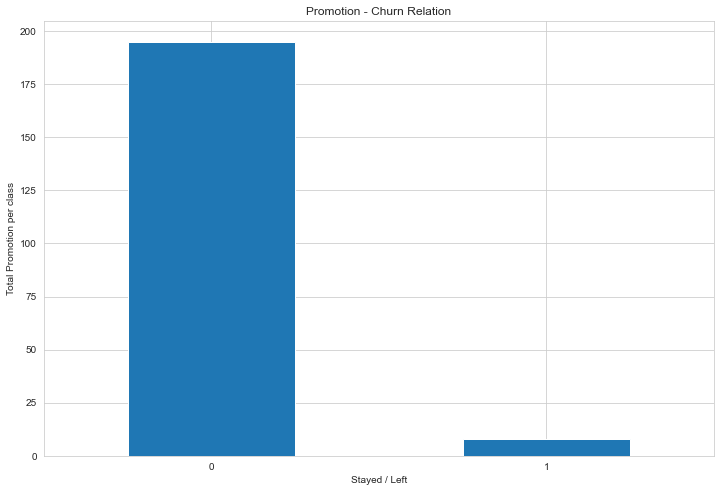

In [23]:
fig,  ax =plt.subplots(figsize=(12,8))

df.groupby("left").promotion_last_5years.sum().plot.bar();

plt.title("Promotion - Churn Relation")
plt.xlabel("Stayed / Left")
plt.ylabel("Total Promotion per class")
plt.xticks(rotation = 0);

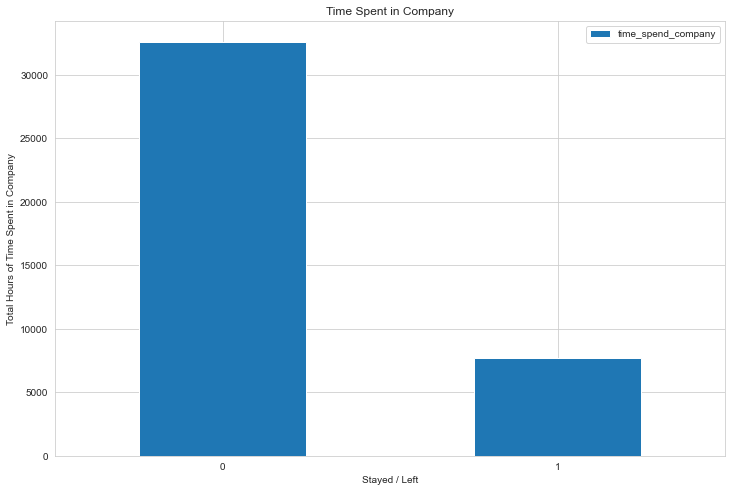

In [24]:
fig,  ax =plt.subplots(figsize=(12,8))

df.groupby("left").time_spend_company.sum().plot.bar();

plt.title("Time Spent in Company")
plt.xlabel("Stayed / Left")
plt.ylabel("Total Hours of Time Spent in Company")
plt.xticks(rotation = 0);
plt.legend()

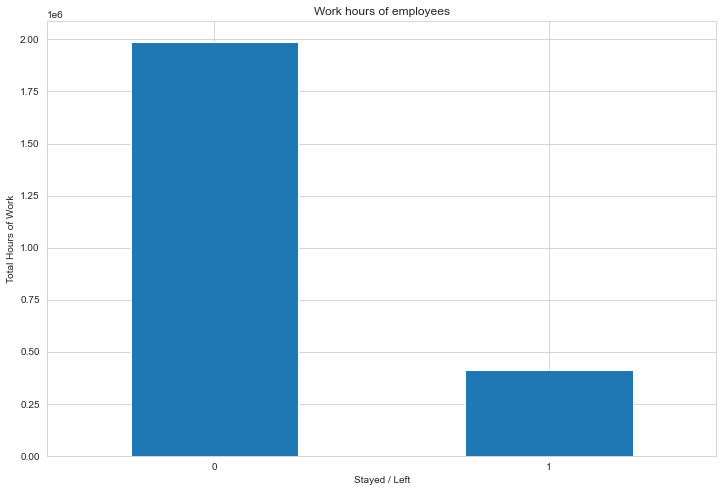

In [25]:
fig,  ax =plt.subplots(figsize=(12,8))

df.groupby("left").average_montly_hours.sum().plot.bar();

plt.title("Work hours of employees")
plt.xlabel("Stayed / Left")
plt.ylabel("Total Hours of Work")
plt.xticks(rotation = 0);

(array([0, 1, 2]),
 [Text(0, 0, 'low'), Text(1, 0, 'medium'), Text(2, 0, 'high')])

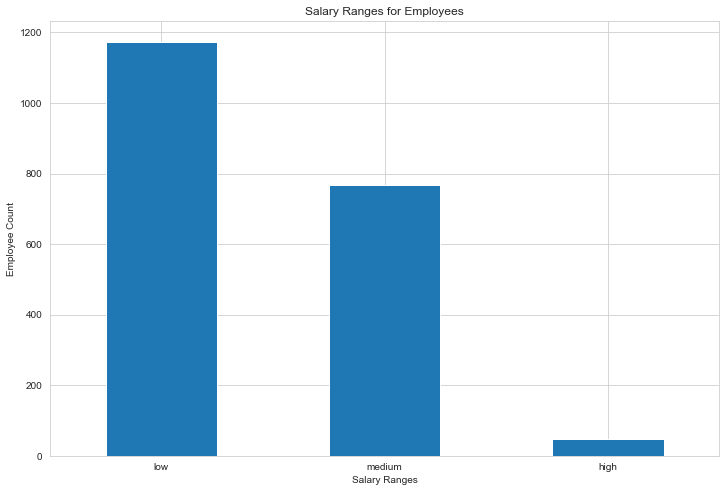

In [26]:
fig,  ax =plt.subplots(figsize=(12,8))

df_left.salary.value_counts().plot.bar();

plt.title("Salary Ranges for Employees")
plt.xlabel("Salary Ranges")
plt.ylabel("Employee Count")
plt.xticks(rotation = 0)

## 2. Data Visualization

You can search for answers to the following questions using data visualization methods. Based on these responses, you can develop comments about the factors that cause churn.
- How does the promotion status affect employee churn?
- How does years of experience affect employee churn?
- How does workload affect employee churn?
- How does the salary level affect employee churn?

*Feel free to add more visualization

In [27]:
df.head()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,work_accident,left,promotion_last_5years,departments,salary
0,0.380,0.530,2,157,3,0,1,0,sales,low
1,0.800,0.860,5,262,6,0,1,0,sales,medium
2,0.110,0.880,7,272,4,0,1,0,sales,medium
3,0.720,0.870,5,223,5,0,1,0,sales,low
4,0.370,0.520,2,159,3,0,1,0,sales,low


### Number of Projects

Similarly, you can also plot a bar graph to count the number of employees deployed on how many projects?

Text(0, 0.5, 'Nr. of Projects')

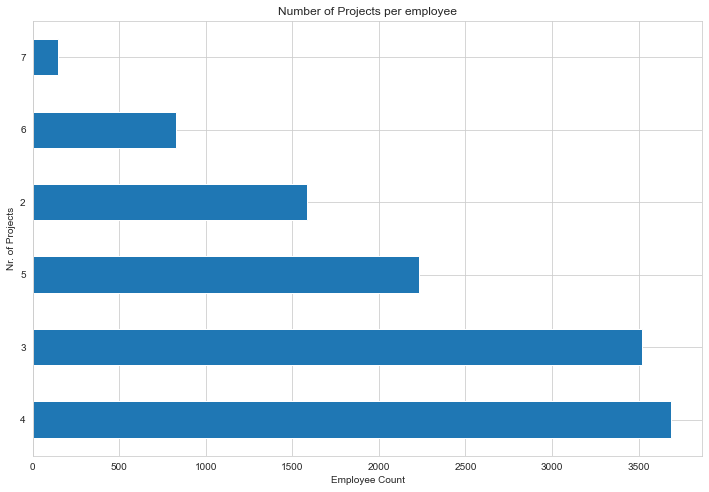

In [28]:
fig,  ax =plt.subplots(figsize=(12,8))

df.number_project.value_counts().plot.barh();

plt.title("Number of Projects per employee")
plt.xlabel("Employee Count")
plt.ylabel("Nr. of Projects")

### Time Spent in Company

Similarly, you can also plot a bar graph to count the number of employees have based on how much experience?


Text(0, 0.5, 'Years Spent')

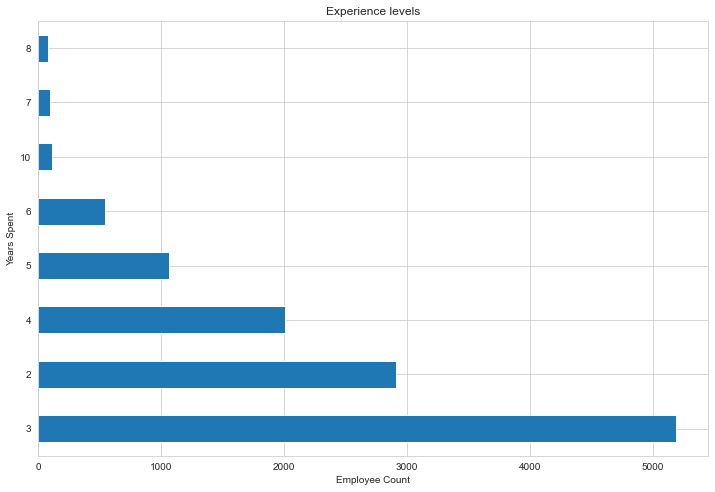

In [29]:
fig,  ax =plt.subplots(figsize=(12,8))

df.time_spend_company.value_counts().plot.barh();

plt.title("Experience levels")
plt.xlabel("Employee Count")
plt.ylabel("Years Spent")

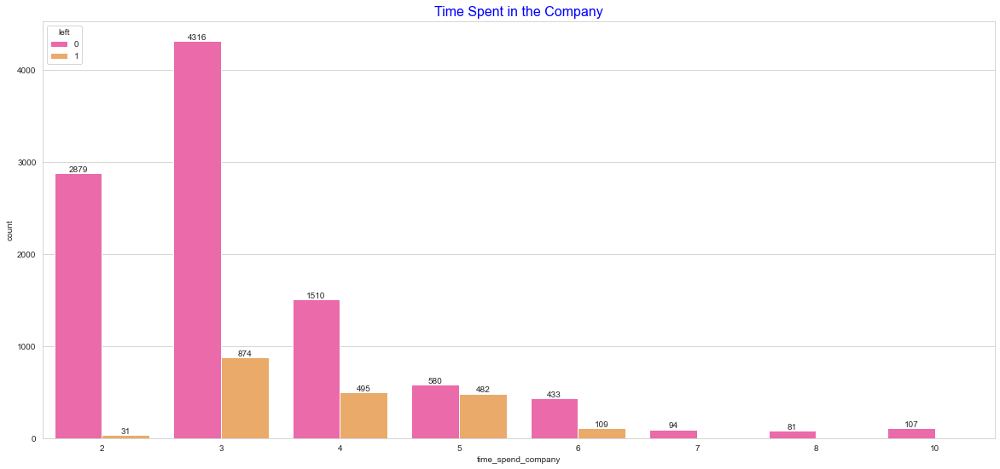

In [30]:
#Alternative

plt.figure(figsize=(20, 9))
palette = sns.color_palette('Paired')
ax = sns.countplot(data=df, x='time_spend_company', hue='left', palette="spring")
ax.set_title('Time Spent in the Company',
             fontsize=16, color='b')

for container in ax.containers:
    ax.bar_label(container)
plt.show()

### Subplots of Features

You can use the methods of the matplotlib.

Text(0, 0.5, 'Number of Sales')

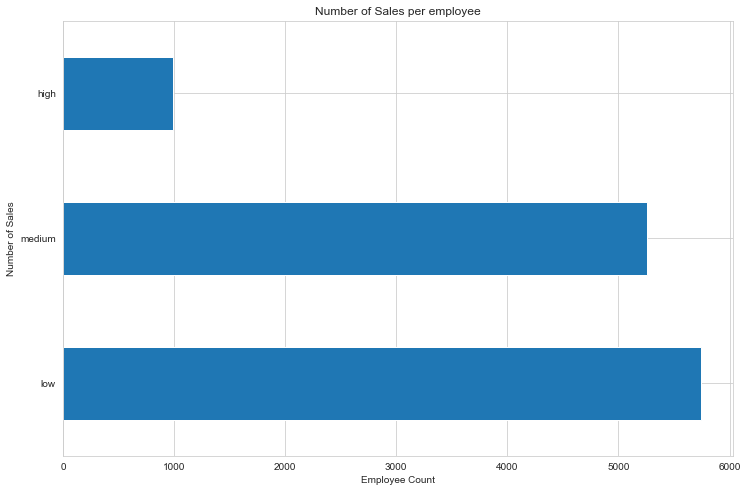

In [31]:
fig,  ax =plt.subplots(figsize=(12,8))

df.salary.value_counts().plot.barh();

plt.title("Number of Sales per employee")
plt.xlabel("Employee Count")
plt.ylabel("Number of Sales")

Text(0, 0.5, 'Number of Promotion Last 5 Years')

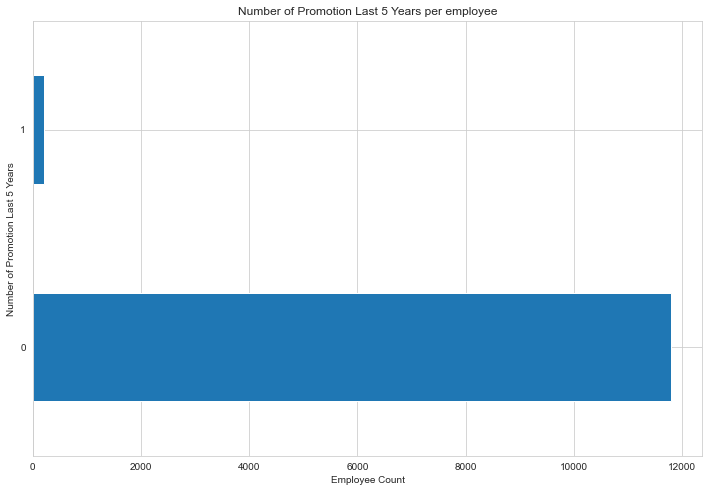

In [32]:
fig,  ax =plt.subplots(figsize=(12,8))

df.promotion_last_5years.value_counts().plot.barh();

plt.title("Number of Promotion Last 5 Years per employee")
plt.xlabel("Employee Count")
plt.ylabel("Number of Promotion Last 5 Years")

Text(0, 0.5, 'Number of Departments')

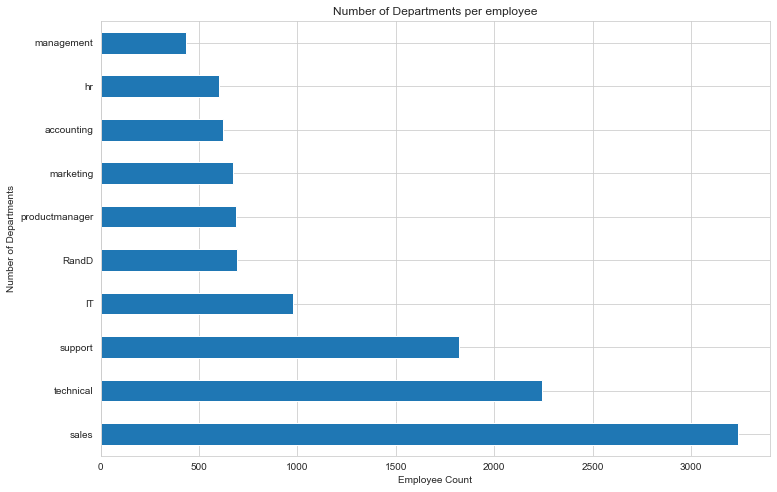

In [33]:
fig,  ax =plt.subplots(figsize=(12,8))

df.departments.value_counts().plot.barh();

plt.title("Number of Departments per employee")
plt.xlabel("Employee Count")
plt.ylabel("Number of Departments")

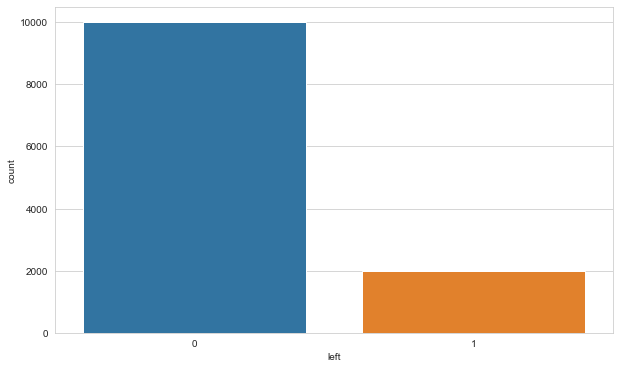

In [34]:
# We have unbalanced data for target feature.

sns.countplot(df["left"])
plt.show()

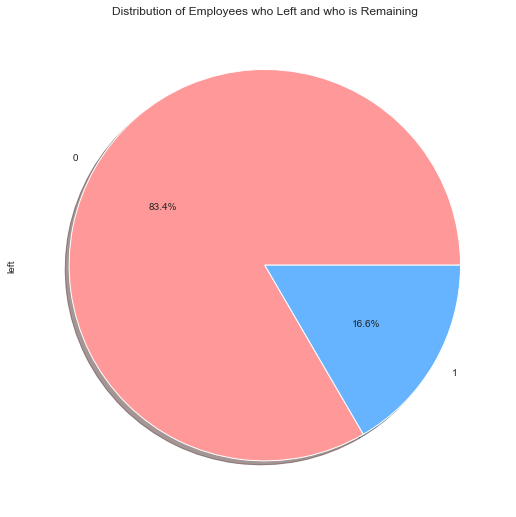

In [35]:
plt.figure(figsize=(20, 9))

df.left.value_counts().plot(
    kind='pie', autopct='%1.1f%%', shadow=True, startangle=0, colors= ['#ff9999','#66b3ff'] )
plt.title('Distribution of Employees who Left and who is Remaining')
plt.show()

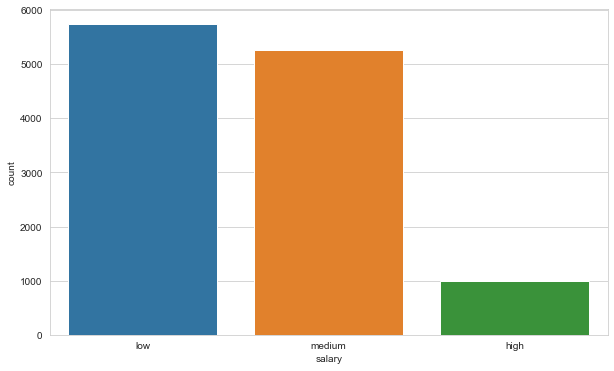

In [36]:
sns.countplot(df["salary"])
plt.show()

In [37]:
#!pip install AutoViz
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()

Imported v0.1.58. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine


Shape of your Data Set loaded: (11991, 10)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  2
    Number of Integer-Categorical Columns =  3
    Number of String-Categorical Columns =  2
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  2
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  0
    Number of Columns to Delete =  0
    9 Predictors classified...
        No variables removed since no ID or low-information variables found in data set

################ Binary_Classification problem #####################
Total Number of Scatter

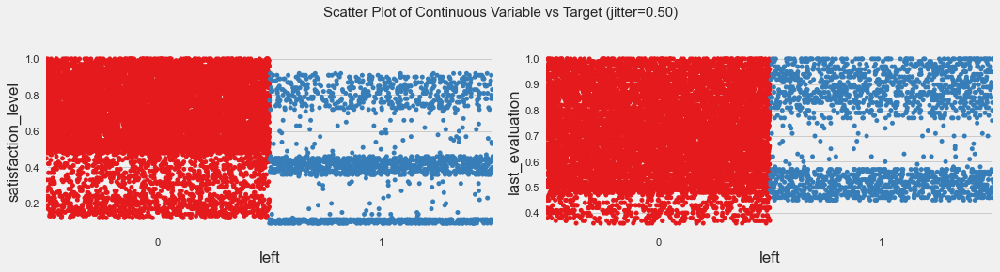

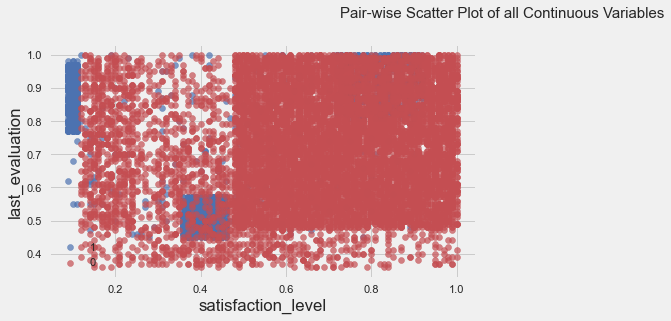

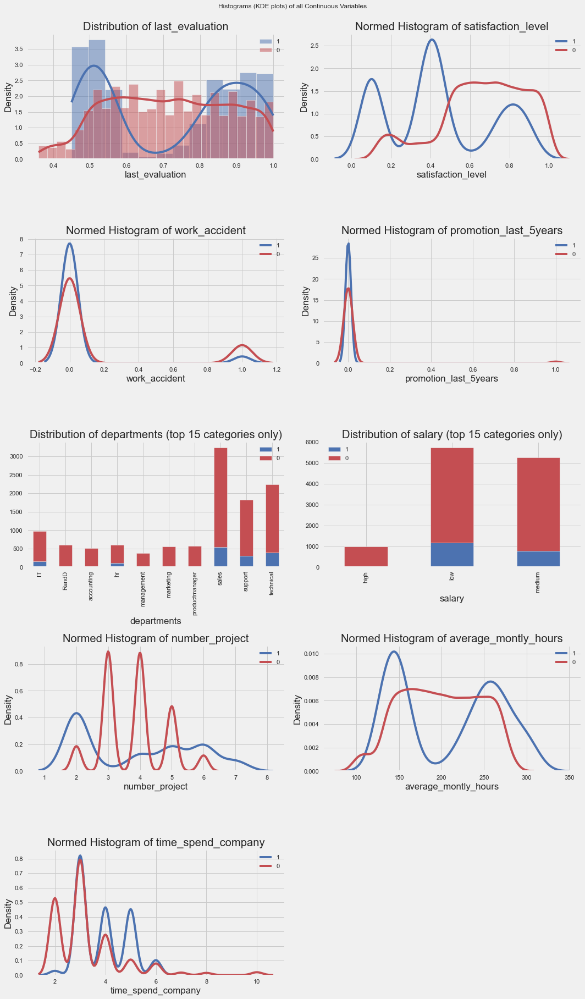

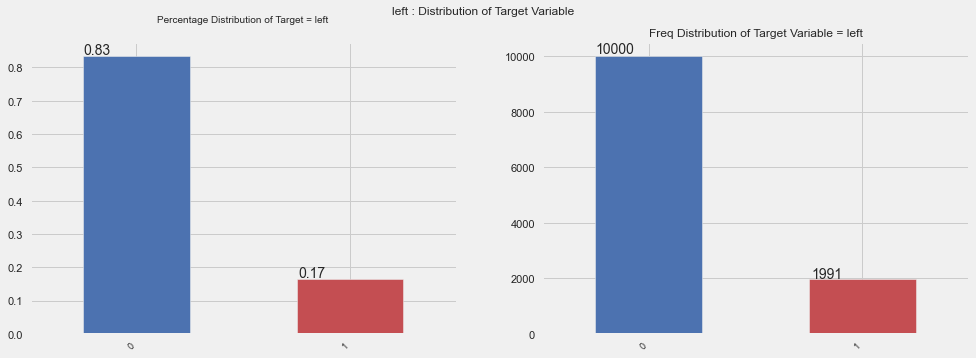

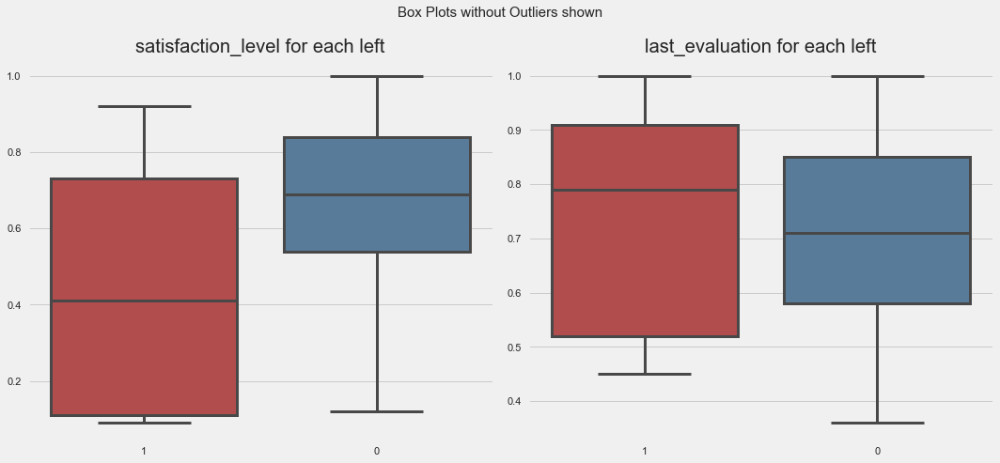

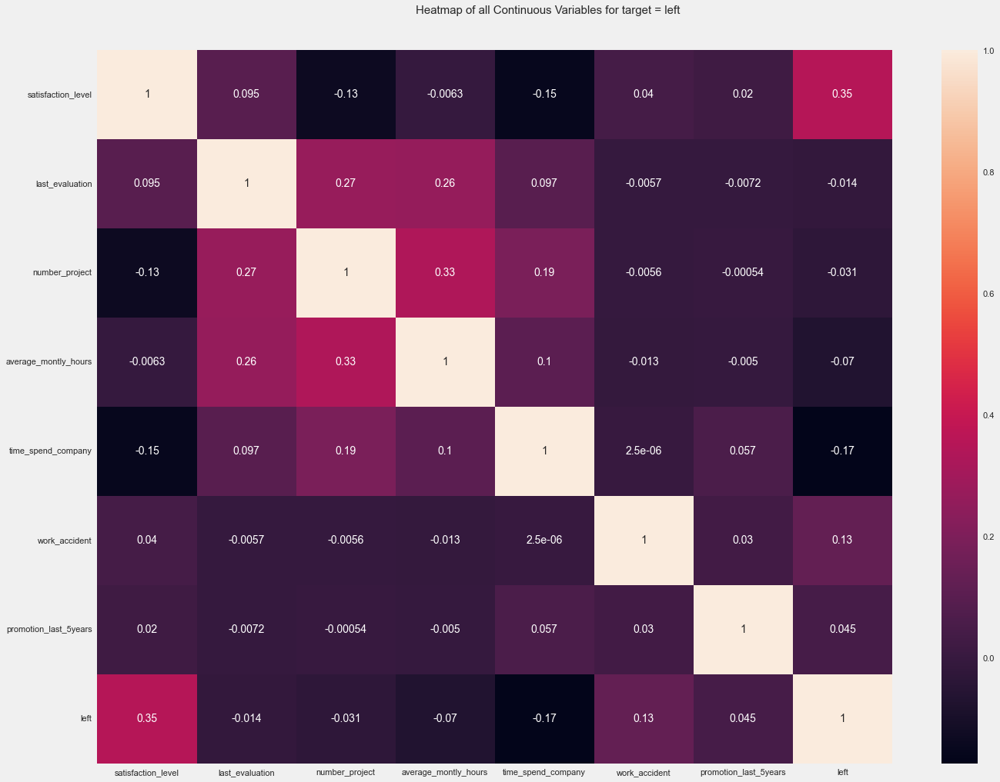

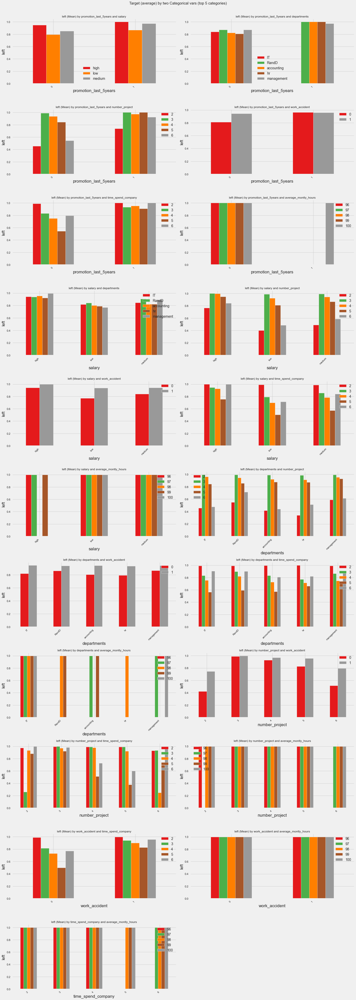

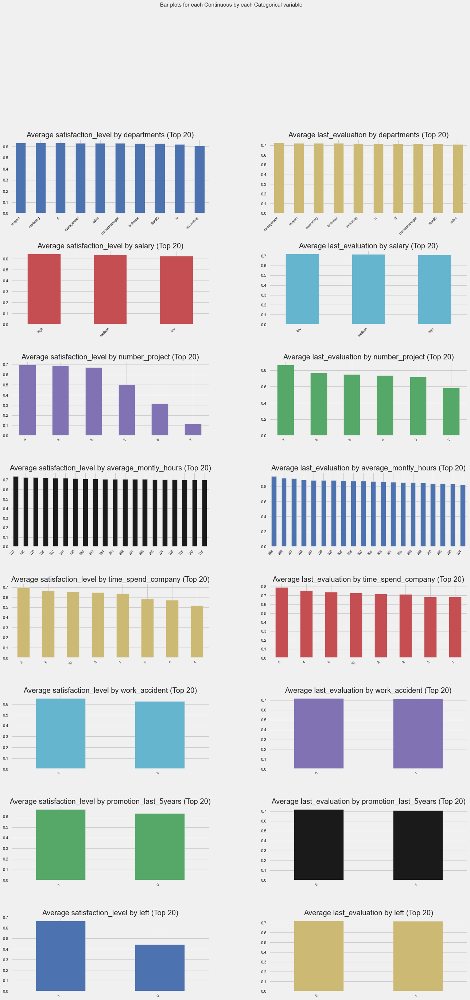

In [38]:
filename = ""
sep = ","
dft = AV.AutoViz(
      filename,
      sep=",",
      depVar="left",
      dfte=df,
      header=0,
      verbose=0,
      lowess=False,
      chart_format="svg",
      max_rows_analyzed=300000,
      max_cols_analyzed=30,
 )

## 3. Data Pre-Processing

#### Encoding

Lots of machine learning algorithms require numerical input data, so you need to represent categorical columns in a numerical column. In order to encode this data, you could map each value to a number. e.g. Salary column's value can be represented as low:0, medium:1, and high:2. This process is known as label encoding, and sklearn conveniently will do this for you using LabelEncoder.



In [39]:
from sklearn.preprocessing import LabelEncoder

In [40]:
df.select_dtypes("object").columns

Index(['departments', 'salary'], dtype='object')

In [41]:
df1 = df.copy()

In [42]:
encoder = LabelEncoder()
df1[["departments","salary"]] = df[["departments","salary"]].apply(encoder.fit_transform)
df1

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,work_accident,left,promotion_last_5years,departments,salary
0,0.380,0.530,2,157,3,0,1,0,7,1
1,0.800,0.860,5,262,6,0,1,0,7,2
2,0.110,0.880,7,272,4,0,1,0,7,2
3,0.720,0.870,5,223,5,0,1,0,7,1
4,0.370,0.520,2,159,3,0,1,0,7,1
...,...,...,...,...,...,...,...,...,...,...
11995,0.900,0.550,3,259,10,1,0,1,4,0
11996,0.740,0.950,5,266,10,0,0,1,4,0
11997,0.850,0.540,3,185,10,0,0,1,4,0
11998,0.330,0.650,3,172,10,0,0,1,5,0


For Salary column, corresponding numbers assigned to values are shown below

0:High
<br>
1:Low
<br>
2:Medium

<Figure size 1440x1440 with 0 Axes>

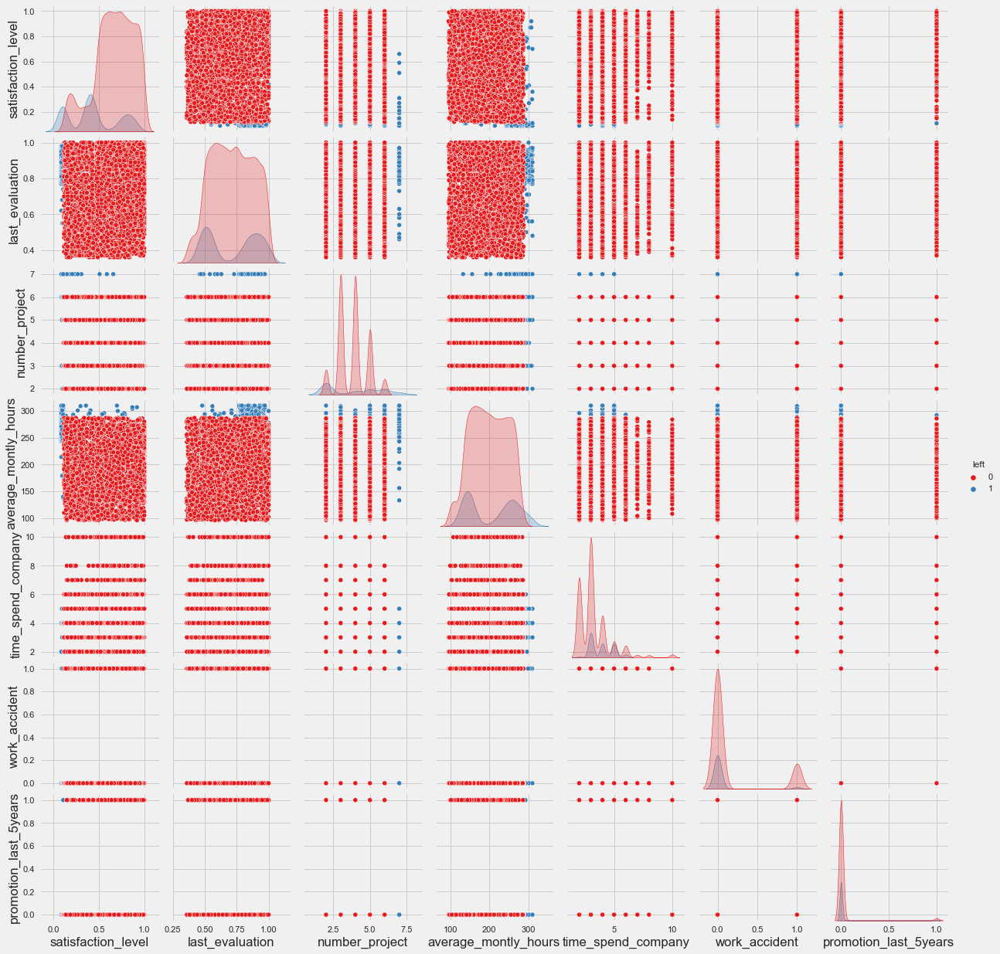

In [43]:
plt.figure(figsize=(20, 20))

sns.pairplot(data=df, hue='left');

#### Scaling

Some machine learning algorithms are sensitive to feature scaling while others are virtually invariant to it. Machine learning algorithms like linear regression, logistic regression, neural network, etc. that use gradient descent as an optimization technique require data to be scaled. Also distance algorithms like KNN, K-means, and SVM are most affected by the range of features. This is because behind the scenes they are using distances between data points to determine their similarity.

Scaling Types:
- Normalization: Normalization is a scaling technique in which values are shifted and rescaled so that they end up ranging between 0 and 1. It is also known as Min-Max scaling.

- Standardization: Standardization is another scaling technique where the values are centered around the mean with a unit standard deviation. This means that the mean of the attribute becomes zero and the resultant distribution has a unit standard deviation.

    

In [44]:
scaler = MinMaxScaler()

In [45]:
df1

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,work_accident,left,promotion_last_5years,departments,salary
0,0.380,0.530,2,157,3,0,1,0,7,1
1,0.800,0.860,5,262,6,0,1,0,7,2
2,0.110,0.880,7,272,4,0,1,0,7,2
3,0.720,0.870,5,223,5,0,1,0,7,1
4,0.370,0.520,2,159,3,0,1,0,7,1
...,...,...,...,...,...,...,...,...,...,...
11995,0.900,0.550,3,259,10,1,0,1,4,0
11996,0.740,0.950,5,266,10,0,0,1,4,0
11997,0.850,0.540,3,185,10,0,0,1,4,0
11998,0.330,0.650,3,172,10,0,0,1,5,0


In [46]:
df1_cols = df1.columns

In [47]:
df_scaled = scaler.fit_transform(df1)
df_scaled = pd.DataFrame(df_scaled , columns= df1_cols)

## 4. Cluster Analysis

- Cluster analysis or clustering is the task of grouping a set of objects in such a way that objects in the same group (called a cluster) are more similar (in some sense) to each other than to those in other groups (clusters). It is a main task of exploratory data mining, and a common technique for statistical data analysis, used in many fields, including pattern recognition, image analysis, information retrieval, bioinformatics, data compression, computer graphics and machine learning.

    [Cluster Analysis](https://en.wikipedia.org/wiki/Cluster_analysis)

    [Cluster Analysis2](https://realpython.com/k-means-clustering-python/)

#### The Elbow Method

- "Elbow Method" can be used to find the optimum number of clusters in cluster analysis. The elbow method is used to determine the optimal number of clusters in k-means clustering. The elbow method plots the value of the cost function produced by different values of k. If k increases, average distortion will decrease, each cluster will have fewer constituent instances, and the instances will be closer to their respective centroids. However, the improvements in average distortion will decline as k increases. The value of k at which improvement in distortion declines the most is called the elbow, at which we should stop dividing the data into further clusters.

    [The Elbow Method](https://en.wikipedia.org/wiki/Elbow_method_(clustering)

    [The Elbow Method2](https://medium.com/@mudgalvivek2911/machine-learning-clustering-elbow-method-4e8c2b404a5d)

    [KMeans](https://towardsdatascience.com/understanding-k-means-clustering-in-machine-learning-6a6e67336aa1)

Let's find out the groups of employees who left. You can observe that the most important factor for any employee to stay or leave is satisfaction and performance in the company. So let's bunch them in the group of people using cluster analysis.

In [48]:
df_scaled.head()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,work_accident,left,promotion_last_5years,departments,salary
0,0.319,0.266,0.000,0.285,0.125,0.000,1.000,0.000,0.778,0.500
1,0.780,0.781,0.600,0.776,0.500,0.000,1.000,0.000,0.778,1.000
2,0.022,0.812,1.000,0.822,0.250,0.000,1.000,0.000,0.778,1.000
3,0.692,0.797,0.600,0.593,0.375,0.000,1.000,0.000,0.778,0.500
4,0.308,0.250,0.000,0.294,0.125,0.000,1.000,0.000,0.778,0.500


In [49]:
df_scaled.pop("left")

0       1.000
1       1.000
2       1.000
3       1.000
4       1.000
         ... 
11986   0.000
11987   0.000
11988   0.000
11989   0.000
11990   0.000
Name: left, Length: 11991, dtype: float64

In [50]:
ssd = []  # sum squared distance

K = range(2,12)  

for k in K:
    model = KMeans(n_clusters =k, random_state=42)
    model.fit(df_scaled)
    ssd.append(model.inertia_) 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Text(0.5, 1.0, 'elbow method')

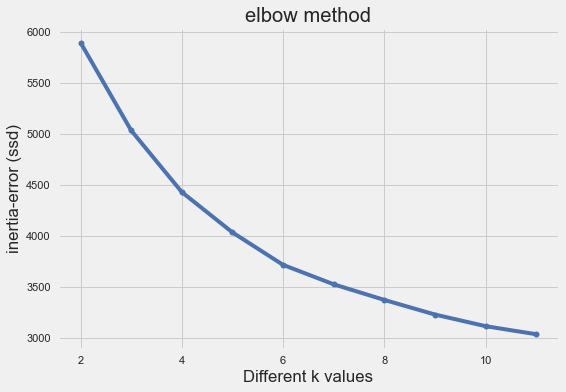

In [51]:
plt.plot(K, ssd, "bo-")
plt.xlabel("Different k values")
plt.ylabel("inertia-error (ssd)") 
plt.title("elbow method")

In [52]:
ssd

[5897.423660642249,
 5034.585745757347,
 4429.507024196925,
 4033.589728451918,
 3714.591755601914,
 3523.62964905037,
 3370.2917440511915,
 3226.6182122335213,
 3112.402194974871,
 3033.2285271388882]

In [53]:
pd.Series(ssd).diff()

0        NaN
1   -862.838
2   -605.079
3   -395.917
4   -318.998
5   -190.962
6   -153.338
7   -143.674
8   -114.216
9    -79.174
dtype: float64

In [54]:
df_diff =pd.DataFrame(-pd.Series(ssd).diff()).rename(index = lambda x : x+1)
df_diff

,0
1,NaN
2,862.838
3,605.079
4,395.917
5,318.998
6,190.962
7,153.338
8,143.674
9,114.216
10,79.174


<IPython.core.display.Javascript object>

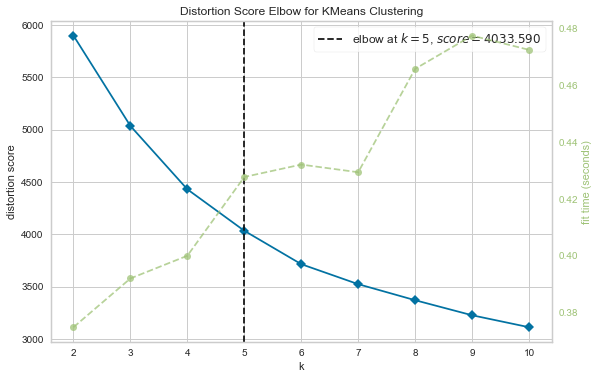

In [55]:
from yellowbrick.cluster import KElbowVisualizer

model_ = KMeans(random_state=42)
visualizer = KElbowVisualizer(model_, k=(2,11))

visualizer.fit(df_scaled)       
visualizer.show();

In [56]:
from sklearn.metrics import silhouette_score

In [58]:
range_n_clusters = range(2,12)
for num_clusters in range_n_clusters:
    # intialise kmeans
    kmeans = KMeans(n_clusters=num_clusters, random_state=42)
    kmeans.fit(df_scaled)
    cluster_labels = kmeans.labels_
    # silhouette score
    silhouette_avg = silhouette_score(df_scaled, cluster_labels)
    print(f"For n_clusters={num_clusters}, the silhouette score is {silhouette_avg}")

<IPython.core.display.Javascript object>

For n_clusters=2, the silhouette score is 0.3206987112924166


<IPython.core.display.Javascript object>

For n_clusters=3, the silhouette score is 0.22209922292746462


<IPython.core.display.Javascript object>

For n_clusters=4, the silhouette score is 0.19906746316679588


<IPython.core.display.Javascript object>

For n_clusters=5, the silhouette score is 0.2104284668094636


<IPython.core.display.Javascript object>

For n_clusters=6, the silhouette score is 0.20806797026856516


<IPython.core.display.Javascript object>

For n_clusters=7, the silhouette score is 0.20922917244172812


<IPython.core.display.Javascript object>

For n_clusters=8, the silhouette score is 0.2049820407574877


<IPython.core.display.Javascript object>

For n_clusters=9, the silhouette score is 0.19333934661621532


<IPython.core.display.Javascript object>

For n_clusters=10, the silhouette score is 0.19046099816199055


<IPython.core.display.Javascript object>

For n_clusters=11, the silhouette score is 0.192274554634586


Regarding the scores and considering the cost of the model, k is selected as 3.

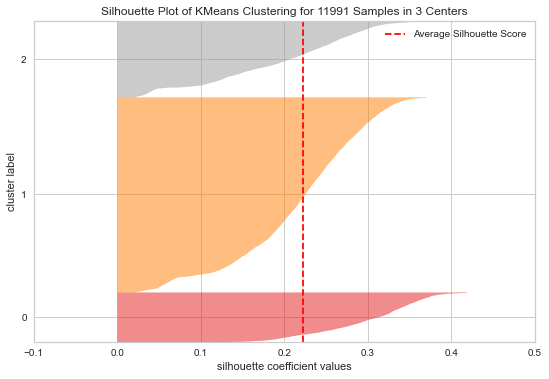

In [59]:
from sklearn.cluster import KMeans

from yellowbrick.cluster import SilhouetteVisualizer

model = KMeans(n_clusters = 3 , random_state= 42)
visualizer = SilhouetteVisualizer(model)

visualizer.fit(df_scaled)
visualizer.poof();

In [60]:
k_means_model = KMeans(n_clusters=3, random_state=101)
k_means_model.fit_predict(df_scaled)

array([2, 2, 2, ..., 0, 2, 0])

In [61]:
df_scaled['pred_clusters'] = k_means_model.labels_
df_scaled.head()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,work_accident,promotion_last_5years,departments,salary,pred_clusters
0,0.319,0.266,0.000,0.285,0.125,0.000,0.000,0.778,0.500,2
1,0.780,0.781,0.600,0.776,0.500,0.000,0.000,0.778,1.000,2
2,0.022,0.812,1.000,0.822,0.250,0.000,0.000,0.778,1.000,2
3,0.692,0.797,0.600,0.593,0.375,0.000,0.000,0.778,0.500,2
4,0.308,0.250,0.000,0.294,0.125,0.000,0.000,0.778,0.500,2


In [62]:
df_scaled.pred_clusters.value_counts()

2    7310
0    2831
1    1850
Name: pred_clusters, dtype: int64

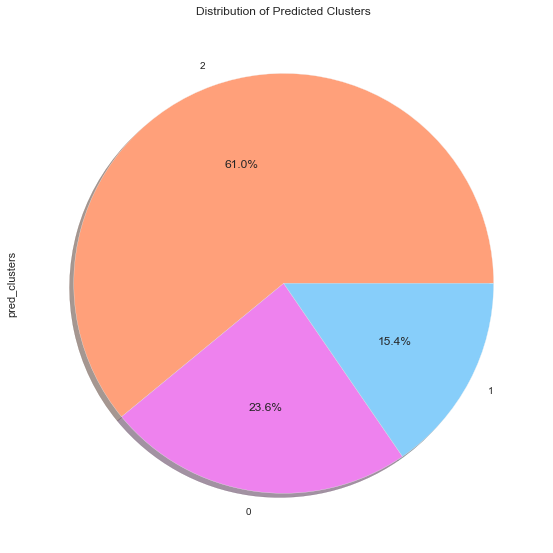

In [63]:
plt.figure(figsize=(20, 9))
df_scaled.pred_clusters.value_counts().plot(
    kind='pie', autopct='%1.1f%%', shadow=True, startangle=0, colors=["lightsalmon", "violet","lightskyblue"])
plt.title('Distribution of Predicted Clusters')
plt.show()

## 5. Model Building

### Split Data as Train and Test Set

In [64]:
from sklearn.model_selection import train_test_split

In [65]:
X = df.drop("left",axis=1)
y = df.left

In [66]:
X1 = X.copy()
X1

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,work_accident,promotion_last_5years,departments,salary
0,0.380,0.530,2,157,3,0,0,sales,low
1,0.800,0.860,5,262,6,0,0,sales,medium
2,0.110,0.880,7,272,4,0,0,sales,medium
3,0.720,0.870,5,223,5,0,0,sales,low
4,0.370,0.520,2,159,3,0,0,sales,low
...,...,...,...,...,...,...,...,...,...
11995,0.900,0.550,3,259,10,1,1,management,high
11996,0.740,0.950,5,266,10,0,1,management,high
11997,0.850,0.540,3,185,10,0,1,management,high
11998,0.330,0.650,3,172,10,0,1,marketing,high


In [67]:
X1_cols= X1.columns
X1_cols

Index(['satisfaction_level', 'last_evaluation', 'number_project',
       'average_montly_hours', 'time_spend_company', 'work_accident',
       'promotion_last_5years', 'departments', 'salary'],
      dtype='object')

### #XGBoost Classifier

In [69]:
encoder = LabelEncoder()
X1[["departments","salary"]] = X[["departments","salary"]].apply(encoder.fit_transform)
X1

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,work_accident,promotion_last_5years,departments,salary
0,0.380,0.530,2,157,3,0,0,7,1
1,0.800,0.860,5,262,6,0,0,7,2
2,0.110,0.880,7,272,4,0,0,7,2
3,0.720,0.870,5,223,5,0,0,7,1
4,0.370,0.520,2,159,3,0,0,7,1
...,...,...,...,...,...,...,...,...,...
11995,0.900,0.550,3,259,10,1,1,4,0
11996,0.740,0.950,5,266,10,0,1,4,0
11997,0.850,0.540,3,185,10,0,1,4,0
11998,0.330,0.650,3,172,10,0,1,5,0


In [70]:
X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y, test_size=0.2, random_state=42, stratify = y)

In some kind of models (i.e XGBoost) scaling may not be needed. Because the models may not be sensible to distance or the model can handle outliers itself in the background algorithm. However, for the ones which needs scaling, the importance and impact of scaling on the score is vital. In order not to skip scaling for a model amid large load of code blocks it is better to use scaled data in all of the models.

In [71]:
X1_train= scaler.fit_transform(X1_train)
X1_test = scaler.transform(X1_test)

In [72]:
#!pip install xgboost
import xgboost as xgb

xgb.__version__ 

'1.7.0'

In [73]:
from sklearn.utils import class_weight

In [74]:
from sklearn.utils import class_weight
from xgboost import XGBClassifier

model = XGBClassifier(random_state = 42)

classes_weights = class_weight.compute_sample_weight(
    class_weight='balanced', y=y1_train
)

model.fit(X1_train, y1_train, sample_weight=classes_weights)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=42, ...)

In [75]:
from xgboost import XGBClassifier

model = XGBClassifier(random_state = 42)

model.fit(X1_train, y1_train, sample_weight=classes_weights)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=42, ...)

In [76]:
def eval_metric(model, X_train, y_train, X_test, y_test):
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    
    print("TEST REPORT")
    print(classification_report(y_test, y_pred_test))
    plot_confusion_matrix(model, X_test, y_test);

    print("\n"*3, "-*"*30)
    print("TRAIN REPORT")
    print(classification_report(y_train, y_pred_train))
    plot_confusion_matrix(model, X_train, y_train)
    plt.show()

TEST REPORT
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2001
           1       0.94      0.93      0.94       398

    accuracy                           0.98      2399
   macro avg       0.96      0.96      0.96      2399
weighted avg       0.98      0.98      0.98      2399




 -*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
TRAIN REPORT
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      7999
           1       0.99      1.00      0.99      1593

    accuracy                           1.00      9592
   macro avg       0.99      1.00      1.00      9592
weighted avg       1.00      1.00      1.00      9592



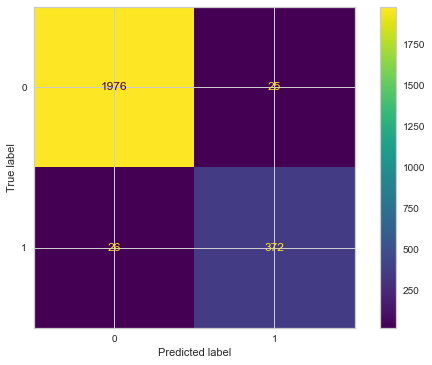

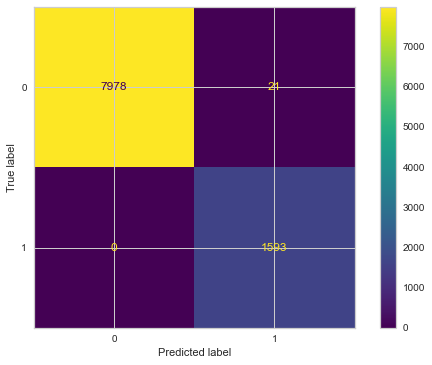

In [77]:
eval_metric(model, X1_train, y1_train, X1_test, y1_test)

### XGBoost Cross Validation

In [78]:
X1_cols= X1.columns
X1_cols

Index(['satisfaction_level', 'last_evaluation', 'number_project',
       'average_montly_hours', 'time_spend_company', 'work_accident',
       'promotion_last_5years', 'departments', 'salary'],
      dtype='object')

In [79]:
X1_train = pd.DataFrame(X1_train , columns = X1_cols)
X1_test = pd.DataFrame(X1_test)
y1_train = pd.DataFrame(y1_train)
y1_test = pd.DataFrame(y1_test)
X1_train

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,work_accident,promotion_last_5years,departments,salary
0,0.978,0.859,0.400,0.673,0.125,0.000,0.000,1.000,0.500
1,0.593,0.828,0.200,0.668,0.125,0.000,0.000,0.000,1.000
2,0.835,0.359,0.200,0.650,0.125,0.000,0.000,0.889,0.500
3,0.516,0.047,0.200,0.047,0.750,0.000,0.000,0.444,0.000
4,0.451,0.609,0.800,0.145,0.125,0.000,0.000,0.778,0.500
...,...,...,...,...,...,...,...,...,...
9587,0.879,0.844,0.400,0.266,0.125,0.000,0.000,0.889,0.500
9588,0.527,0.094,0.000,0.710,0.250,0.000,0.000,0.000,1.000
9589,0.835,0.516,0.600,0.827,0.125,1.000,0.000,0.333,0.500
9590,0.626,0.406,0.200,0.224,0.125,0.000,0.000,0.444,0.500


In [80]:
scoring = ["accuracy", "precision", "recall", "f1"]

In [81]:
from sklearn.model_selection import cross_val_score, cross_validate
scores = cross_validate(model, X1_train, y1_train, scoring = scoring, cv = 10)
df_scores =    pd.DataFrame.from_records(scores)
df_scores.mean()[2:]

test_accuracy    0.983
test_f1          0.947
test_precision   0.976
test_recall      0.920
dtype: float64

In [82]:
model.feature_importances_

array([0.21031298, 0.06599653, 0.15450968, 0.04043276, 0.40663052,
       0.05620221, 0.01806865, 0.01835246, 0.02949428], dtype=float32)

In [83]:
model.feature_importances_.sum() #The sum of importances should be equal to 1.

1.0

In [84]:
features = pd.DataFrame(index=X1.columns, data=model.feature_importances_, columns=['xgb_importance'])
xgb_imp_feats = features.sort_values("xgb_importance", ascending=False)
xgb_imp_feats

,xgb_importance
time_spend_company,0.407
satisfaction_level,0.210
number_project,0.155
last_evaluation,0.066
work_accident,0.056
average_montly_hours,0.040
salary,0.029
departments,0.018
promotion_last_5years,0.018


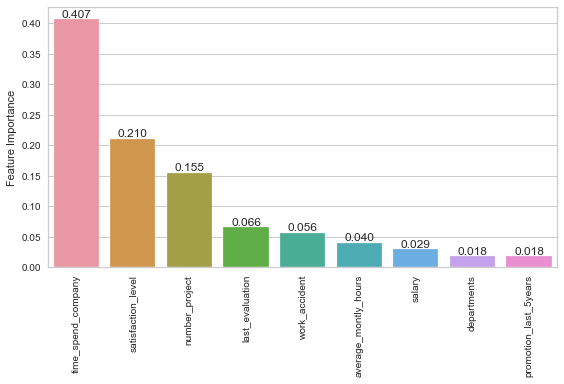

In [85]:
df_f_i = pd.DataFrame(data = model.feature_importances_, index=X1.columns, #index=X.columns
                      columns = ["Feature Importance"]).sort_values("Feature Importance", ascending=False)

ax = sns.barplot(x = df_f_i.index, y = 'Feature Importance', data = df_f_i)
ax.bar_label(ax.containers[0],fmt="%.3f");
plt.xticks(rotation = 90)
plt.tight_layout()

### Dropping the most important feature to see whether there is a significant change on the scores or not.

In [86]:
X2 = X1.drop(columns = ["time_spend_company"])
X2

,satisfaction_level,last_evaluation,number_project,average_montly_hours,work_accident,promotion_last_5years,departments,salary
0,0.380,0.530,2,157,0,0,7,1
1,0.800,0.860,5,262,0,0,7,2
2,0.110,0.880,7,272,0,0,7,2
3,0.720,0.870,5,223,0,0,7,1
4,0.370,0.520,2,159,0,0,7,1
...,...,...,...,...,...,...,...,...
11995,0.900,0.550,3,259,1,1,4,0
11996,0.740,0.950,5,266,0,1,4,0
11997,0.850,0.540,3,185,0,1,4,0
11998,0.330,0.650,3,172,0,1,5,0


In [87]:
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y, test_size=0.2, random_state=42)

In [88]:
model2 = XGBClassifier(random_state = 42)

classes_weights = class_weight.compute_sample_weight(
    class_weight='balanced', y=y2_train
)

model2.fit(X2_train, y2_train, sample_weight=classes_weights)



XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=42, ...)

TEST REPORT
              precision    recall  f1-score   support

           0       0.98      0.97      0.97      1998
           1       0.86      0.89      0.87       401

    accuracy                           0.96      2399
   macro avg       0.92      0.93      0.92      2399
weighted avg       0.96      0.96      0.96      2399




 -*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
TRAIN REPORT
              precision    recall  f1-score   support

           0       1.00      0.99      0.99      8002
           1       0.93      1.00      0.96      1590

    accuracy                           0.99      9592
   macro avg       0.97      0.99      0.98      9592
weighted avg       0.99      0.99      0.99      9592



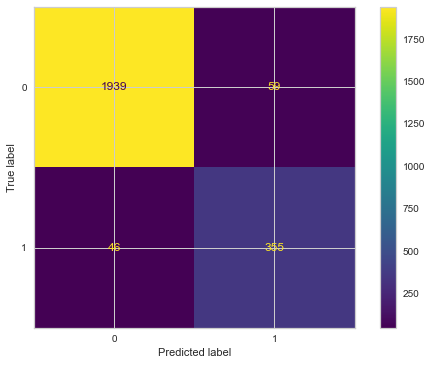

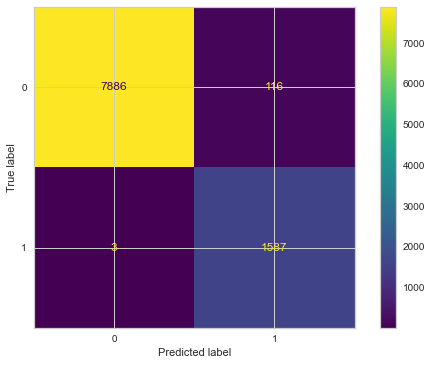

In [89]:
eval_metric(model2, X2_train, y2_train, X2_test, y2_test)

In [90]:
scores2 = cross_validate(model2,X2_train, y2_train, scoring = scoring, cv = 10)
df_scores2 = pd.DataFrame(scores2, index = range(1, 11))
df_scores2.mean()[2:]


test_accuracy    0.964
test_precision   0.910
test_recall      0.867
test_f1          0.888
dtype: float64

As shown above, dropping the most important feature causes overfit in the model, hence we are not going to drop.

### Grid Search 

Rebuilding entire model since we did not use pipeline.

In [91]:
encoder = LabelEncoder()
X1[["departments","salary"]] = X[["departments","salary"]].apply(encoder.fit_transform)
X1

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,work_accident,promotion_last_5years,departments,salary
0,0.380,0.530,2,157,3,0,0,7,1
1,0.800,0.860,5,262,6,0,0,7,2
2,0.110,0.880,7,272,4,0,0,7,2
3,0.720,0.870,5,223,5,0,0,7,1
4,0.370,0.520,2,159,3,0,0,7,1
...,...,...,...,...,...,...,...,...,...
11995,0.900,0.550,3,259,10,1,1,4,0
11996,0.740,0.950,5,266,10,0,1,4,0
11997,0.850,0.540,3,185,10,0,1,4,0
11998,0.330,0.650,3,172,10,0,1,5,0


In [92]:
X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y, test_size=0.2, random_state=42, stratify = y)

In [93]:
X1_train= scaler.fit_transform(X1_train)
X1_test = scaler.transform(X1_test)

In [94]:
model = XGBClassifier(random_state = 42)

In [95]:
param_grid = {"model__n_estimators":[50, 100, 200], 'model__max_depth':[3,4,5], "model__learning_rate": [0.1, 0.2,0.5],
             "model__subsample":[0.5, 0.8, 1], "model__colsample_bytree":[0.5,0.7,1]}

In [96]:
#scoring = ["accuracy", "precision", "recall", "f1"] # Since there is single label.

In [97]:
scoring = "f1"

In [98]:
xgb_grid = GridSearchCV(model, param_grid = param_grid, scoring=scoring, cv=5, n_jobs=-1 , verbose = 2)

<IPython.core.display.Javascript object>

In [99]:
xgb_grid.fit(X1_train, y1_train, sample_weight=classes_weights)

Fitting 5 folds for each of 243 candidates, totalling 1215 fits
[13:10:52] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0ac76685cf763591d-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "model__colsample_bytree", "model__learning_rate", "model__max_depth", "model__n_estimators", "model__subsample" } are not used.



GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=42, ...),
             n_jobs=-1,
             param_grid={'model__colsample_bytree': [0.5, 0.7, 1],
                         'model__learning_rate': [0.1, 0.2, 0.5],
                         'model__max_depth': [3, 4, 5],
                         'model__n_estimators': [50, 100, 200],
                         'model__subsample': [0.5, 0.8, 1]},
             scoring='f1', verbose=2)

In [100]:
xgb_grid.best_estimator_

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, model__colsample_bytree=0.5,
              model__learning_rate=0.1, model__max_depth=3,
              model__n_estimators=50, model__subsample=0.5,
              monotone_constraints='()', ...)

In [101]:
xgb_grid.best_params_

{'model__colsample_bytree': 0.5,
 'model__learning_rate': 0.1,
 'model__max_depth': 3,
 'model__n_estimators': 50,
 'model__subsample': 0.5}

In [102]:
xgb_grid.best_score_

0.9434328090833572

TEST REPORT
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2001
           1       0.97      0.93      0.95       398

    accuracy                           0.98      2399
   macro avg       0.98      0.96      0.97      2399
weighted avg       0.98      0.98      0.98      2399




 -*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
TRAIN REPORT
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      7999
           1       0.99      0.96      0.98      1593

    accuracy                           0.99      9592
   macro avg       0.99      0.98      0.99      9592
weighted avg       0.99      0.99      0.99      9592



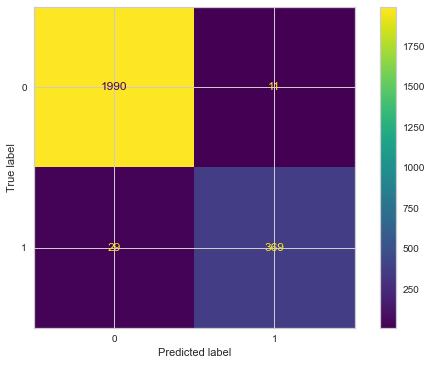

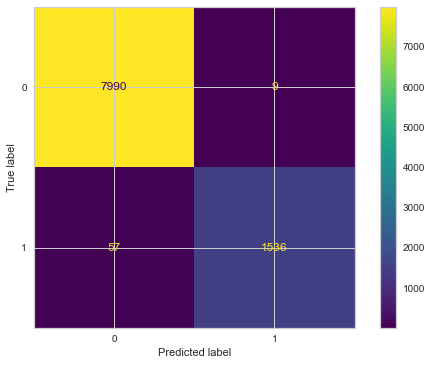

In [103]:
eval_metric(xgb_grid, X1_train, y1_train, X1_test, y1_test)

Since there are values on boundary values, let's add another boundary values to see which one will score better.

In [104]:
# Rebuilding model

X2_train, X2_test, y2_train, y2_test = train_test_split(X1, y, test_size=0.2, random_state=42, stratify = y)

X2_train= scaler.fit_transform(X2_train)
X2_test = scaler.transform(X2_test)

model2 = XGBClassifier(random_state = 42)

param_grid = {"model2__n_estimators":[20,50, 100, 200], 'model2__max_depth':[3,4,5], "model2__learning_rate": [0.05,0.1, 0.2,0.5],
             "model2__subsample":[0.25,0.5, 0.8, 1], "model2__colsample_bytree":[0.3,0.5,0.7,1]}

scoring = "f1"

xgb_grid2 = GridSearchCV(model2, param_grid = param_grid, scoring=scoring, cv=5, n_jobs=-1 , verbose = 2)

xgb_grid2.fit(X2_train, y2_train, sample_weight=classes_weights)

<IPython.core.display.Javascript object>

Fitting 5 folds for each of 768 candidates, totalling 3840 fits
[13:14:55] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0ac76685cf763591d-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "model2__colsample_bytree", "model2__learning_rate", "model2__max_depth", "model2__n_estimators", "model2__subsample" } are not used.



GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=42, ...),
             n_jobs=-1,
             param_grid={'model2__colsample_bytree': [0.3, 0.5, 0.7, 1],
                         'model2__learning_rate': [0.05, 0.1, 0.2, 0.5],
                         'model2__max_depth': [3, 4, 5],
                         'model2__n_estimators': [20, 50, 100, 200],
                         'model2__subsample': [0.25, 0.5, 0.8, 1]},
             scoring='f1', verbose=2)

In [105]:
xgb_grid2.best_estimator_

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, model2__colsample_bytree=0.3,
              model2__learning_rate=0.05, model2__max_depth=3,
              model2__n_estimators=20, model2__subsample=0.25,
              monotone_constraints='()', ...)

In [106]:
xgb_grid2.best_params_

{'model2__colsample_bytree': 0.3,
 'model2__learning_rate': 0.05,
 'model2__max_depth': 3,
 'model2__n_estimators': 20,
 'model2__subsample': 0.25}

In [107]:
xgb_grid2.best_score_ 

0.9434328090833572

TEST REPORT
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2001
           1       0.97      0.93      0.95       398

    accuracy                           0.98      2399
   macro avg       0.98      0.96      0.97      2399
weighted avg       0.98      0.98      0.98      2399




 -*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
TRAIN REPORT
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      7999
           1       0.99      0.96      0.98      1593

    accuracy                           0.99      9592
   macro avg       0.99      0.98      0.99      9592
weighted avg       0.99      0.99      0.99      9592



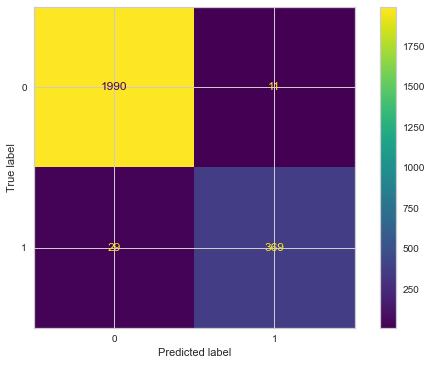

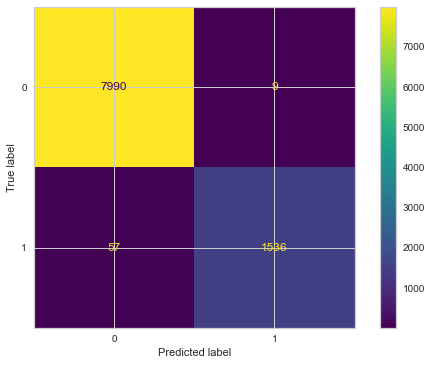

In [108]:
eval_metric(xgb_grid2, X2_train, y2_train, X2_test, y2_test)

The scores are the same. Since we had reduction in learning rate and more detailed model with no score improvement, it may cause overfitting on another large data sets. Let's keep inital model for modelling

In [109]:
xgb_grid.best_params_

{'model__colsample_bytree': 0.5,
 'model__learning_rate': 0.1,
 'model__max_depth': 3,
 'model__n_estimators': 50,
 'model__subsample': 0.5}

## Create the model with optimum hyperparameters and Feature Importances

In [110]:
xgb_model_grid = XGBClassifier(random_state=42, colsample_bytree = 0.5, learning_rate = 0.1, max_depth=3, n_estimators= 50, subsample= 0.5)
xgb_model_grid.fit(X1_train, y1_train, sample_weight=classes_weights)

xgb_model_grid.feature_importances_

feats = pd.DataFrame(index=X1.columns, data=xgb_model_grid.feature_importances_, columns=['xgb_importance'])
xgb_imp_feats = feats.sort_values("xgb_importance", ascending=False)
xgb_imp_feats

,xgb_importance
satisfaction_level,0.333
time_spend_company,0.167
number_project,0.148
average_montly_hours,0.135
last_evaluation,0.122
work_accident,0.040
salary,0.031
promotion_last_5years,0.013
departments,0.011


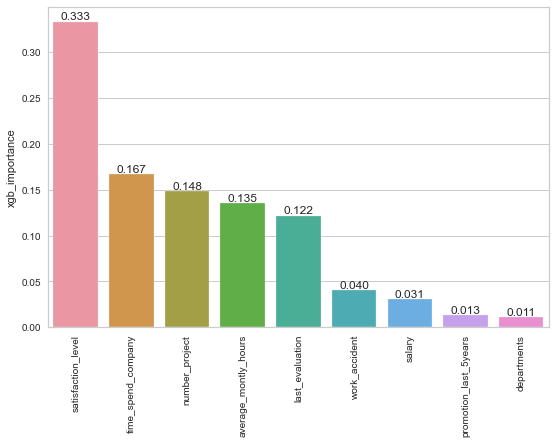

In [111]:
ax = sns.barplot(data=xgb_imp_feats, x=xgb_imp_feats.index,y='xgb_importance')
ax.bar_label(ax.containers[0],fmt="%.3f")
plt.xticks(rotation=90);

## Evaluating ROC Curves and AUC

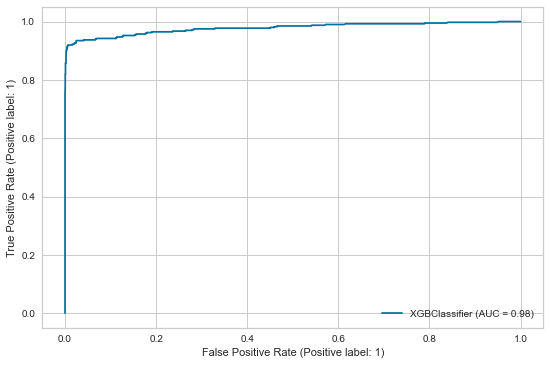

In [112]:
from sklearn.metrics import precision_recall_curve, plot_precision_recall_curve, plot_roc_curve, roc_auc_score

plot_roc_curve(xgb_model_grid, X1_test, y1_test);

For the imbalanced data, precision recall curve is plotted below. 

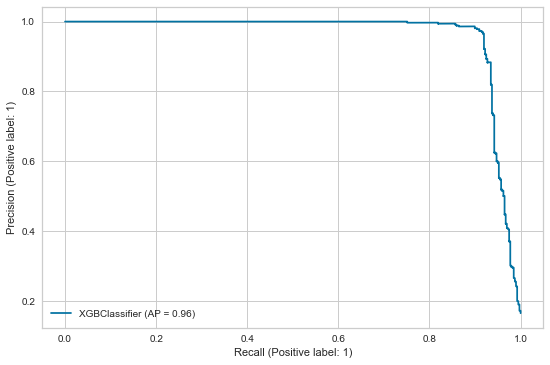

In [113]:
plot_precision_recall_curve(xgb_model_grid, X1_test, y1_test);

### #Distance Based(?) Algorithm

#### Model Building

## K Nearest Neighbors Classifier

Vanilla KNN Model

In [114]:
from sklearn.neighbors import KNeighborsClassifier

In [115]:
KNN_model = KNeighborsClassifier(n_neighbors = 5)
KNN_model.fit(X1_train, y1_train)

y_pred = KNN_model.predict(X1_test)
y_train_pred = KNN_model.predict(X1_train)

KNN_model_f1 = f1_score(y1_test, y_pred)
KNN_model_acc = accuracy_score(y1_test, y_pred)
KNN_model_recall = recall_score(y1_test, y_pred)
KNN_model_auc = roc_auc_score(y1_test, y_pred)

#### Prediction

TEST REPORT
              precision    recall  f1-score   support

           0       0.98      0.97      0.98      2001
           1       0.88      0.91      0.90       398

    accuracy                           0.96      2399
   macro avg       0.93      0.94      0.94      2399
weighted avg       0.97      0.96      0.96      2399




 -*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
TRAIN REPORT
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      7999
           1       0.90      0.90      0.90      1593

    accuracy                           0.97      9592
   macro avg       0.94      0.94      0.94      9592
weighted avg       0.97      0.97      0.97      9592



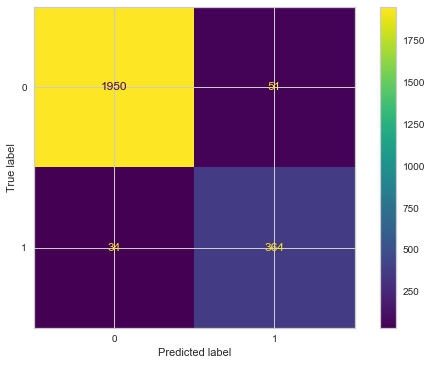

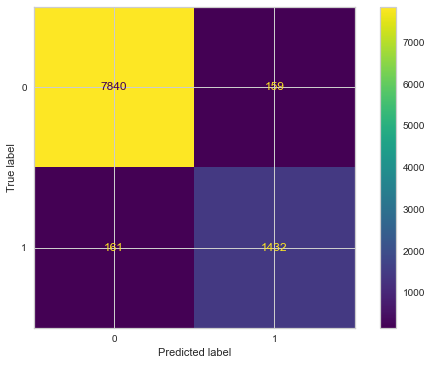

In [116]:
eval_metric(KNN_model, X1_train, y1_train, X1_test, y1_test)

Scores are good. Let's play with hyperparameters.

## Cross Validation

In [117]:
KNN_cv = KNeighborsClassifier(n_neighbors = 5)
KNN_cv_scores = cross_validate(KNN_cv, X1_train, y1_train,
                              scoring = ['accuracy', 'precision','recall', 'f1', 'roc_auc'], cv = 10)
KNN_cv_scores = pd.DataFrame(KNN_cv_scores, index = range(1, 11))
KNN_cv_scores.mean()[2:]

test_accuracy    0.958
test_precision   0.865
test_recall      0.888
test_f1          0.876
test_roc_auc     0.954
dtype: float64

CV scores are reasonable.

### Elbow Method for Choosing Reasonable K Values

In [118]:
test_error_rates = []
for k in range(1, 30):
    KNN = KNeighborsClassifier(n_neighbors = k)
    KNN.fit(X1_train, y1_train)
    y_pred = KNN.predict(X1_test)
    test_error = 1 - accuracy_score(y1_test, y_pred)
    test_error_rates.append(test_error)

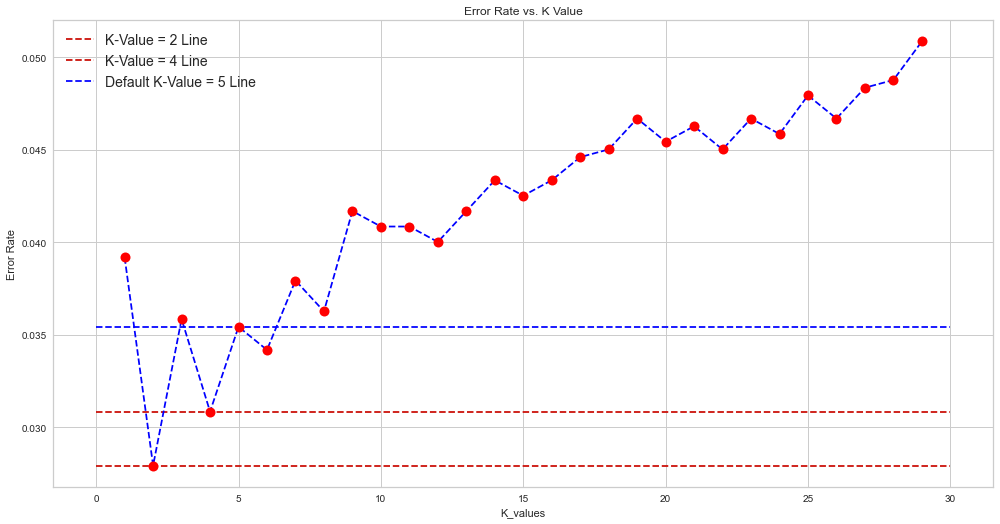

In [119]:
plt.figure(figsize = (15, 8))
plt.plot(range(1, 30), test_error_rates, color = 'blue', linestyle = '--', marker = 'o',
         markerfacecolor = 'red', markersize = 10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K_values')
plt.ylabel('Error Rate')
plt.hlines(y =0.027928303459774928, xmin = 0, xmax = 30, colors = 'r', linestyles = "--", label = "K-Value = 2 Line")
plt.hlines(y = 0.03084618591079613, xmin = 0, xmax = 30, colors = 'r', linestyles = "--", label = "K-Value = 4 Line")
plt.hlines(y = 0.03543142976240099, xmin = 0, xmax = 30, colors = 'blue', linestyles = "--", label = "Default K-Value = 5 Line")
plt.legend(prop = {"size":14});

## K = 2

WITH K=2

TEST REPORT
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      2001
           1       0.94      0.89      0.91       398

    accuracy                           0.97      2399
   macro avg       0.96      0.94      0.95      2399
weighted avg       0.97      0.97      0.97      2399




 -*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
TRAIN REPORT
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      7999
           1       1.00      0.89      0.94      1593

    accuracy                           0.98      9592
   macro avg       0.99      0.95      0.97      9592
weighted avg       0.98      0.98      0.98      9592



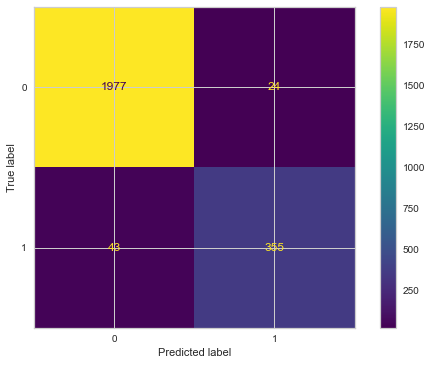

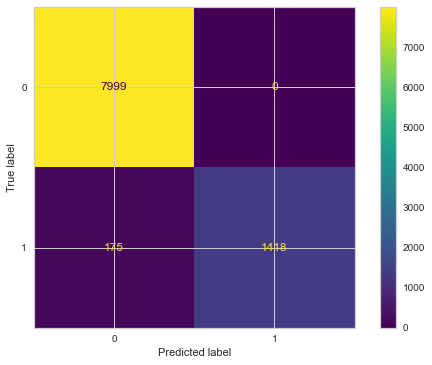

In [120]:
knn2 = KNeighborsClassifier(n_neighbors=2) 

knn2.fit(X1_train,y1_train)
print('WITH K=2\n')
eval_metric(knn2, X1_train, y1_train, X1_test, y1_test)

In [121]:
knn2 = KNeighborsClassifier(n_neighbors = 2)
knn2_cv = cross_validate(knn2, X1_train, y1_train,
                              scoring = ['accuracy', 'precision','recall', 'f1', 'roc_auc'], cv = 10)
knn2_cv = pd.DataFrame(knn2_cv, index = range(1, 11))
knn2_cv.mean()[2:]

test_accuracy    0.962
test_precision   0.913
test_recall      0.856
test_f1          0.883
test_roc_auc     0.944
dtype: float64

## K = 4

WITH K=4

TEST REPORT
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      2001
           1       0.91      0.91      0.91       398

    accuracy                           0.97      2399
   macro avg       0.94      0.95      0.94      2399
weighted avg       0.97      0.97      0.97      2399




 -*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
TRAIN REPORT
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      7999
           1       0.94      0.89      0.91      1593

    accuracy                           0.97      9592
   macro avg       0.96      0.94      0.95      9592
weighted avg       0.97      0.97      0.97      9592



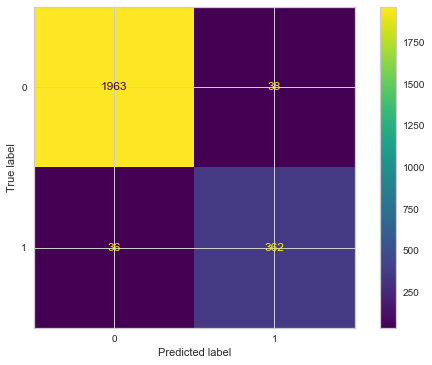

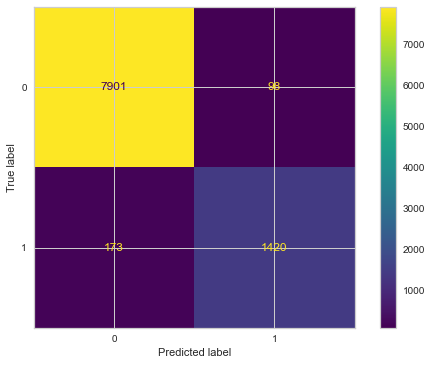

In [122]:
knn4 = KNeighborsClassifier(n_neighbors=4) 

knn4.fit(X1_train,y1_train)
print('WITH K=4\n')
eval_metric(knn4, X1_train, y1_train, X1_test, y1_test)

In [123]:
knn4 = KNeighborsClassifier(n_neighbors = 4)
knn4_cv = cross_validate(knn4, X1_train, y1_train,
                              scoring = ['accuracy', 'precision','recall', 'f1', 'roc_auc'], cv = 10)
knn4_cv = pd.DataFrame(knn4_cv, index = range(1, 11))
knn4_cv.mean()[2:]

test_accuracy    0.962
test_precision   0.893
test_recall      0.877
test_f1          0.884
test_roc_auc     0.953
dtype: float64

The scores of K = 2 and K = 4 are almost identical, let's look for grid search.

### KNN Model GridSearch 

In [124]:
k_values = range(1, 30)
param_grid = {"n_neighbors": k_values, "p": [1, 2], "weights": ['uniform', "distance"]}

In [125]:
KNN_grid = KNeighborsClassifier()
KNN_grid_model = GridSearchCV(KNN_grid, param_grid, cv = 10, scoring = 'recall') 
KNN_grid_model.fit(X1_train, y1_train)

<IPython.core.display.Javascript object>

GridSearchCV(cv=10, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': range(1, 30), 'p': [1, 2],
                         'weights': ['uniform', 'distance']},
             scoring='recall')

In [126]:
KNN_grid_model.best_params_

{'n_neighbors': 18, 'p': 1, 'weights': 'distance'}

In [127]:
KNN_grid_model.best_estimator_

KNeighborsClassifier(n_neighbors=18, p=1, weights='distance')

### Evaluating Precision-Recall Curves, AUC Curves

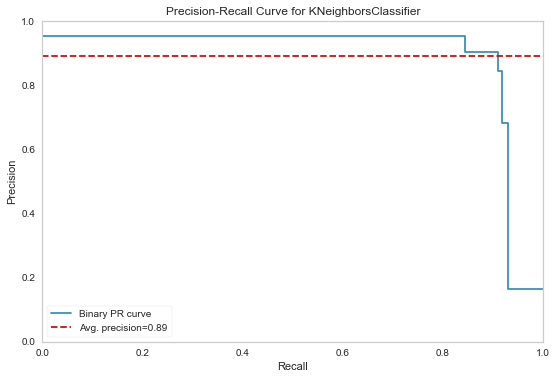

In [128]:
from yellowbrick.classifier import PrecisionRecallCurve

knn_model = knn4

viz = PrecisionRecallCurve(
    knn_model,
    per_class=True,
    cmap="Set1"
)
viz.fit(X1_train, y1_train)
viz.score(X1_test, y1_test)
viz.show();

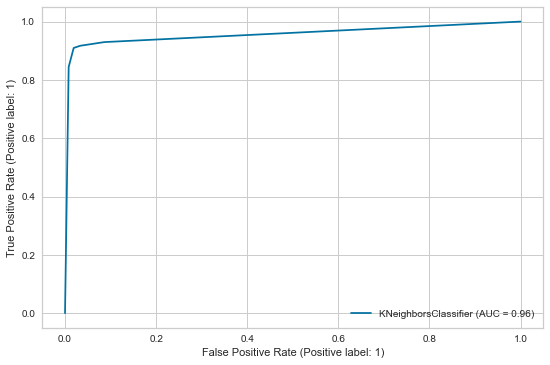

In [129]:
plot_roc_curve(knn_model, X1_test, y1_test);

### #Random Forest Classifier

#### Model Building

In [130]:
from sklearn.ensemble import RandomForestClassifier

In [131]:
RF_model = RandomForestClassifier(class_weight = "balanced", random_state = 42)
RF_model.fit(X1_train, y1_train)
y_pred = RF_model.predict(X1_test)
y_train_pred = RF_model.predict(X1_train)

RF_model_f1 = f1_score(y1_test, y_pred)
RF_model_acc = accuracy_score(y1_test, y_pred)
RF_model_recall = recall_score(y1_test, y_pred)
RF_model_auc = roc_auc_score(y1_test, y_pred)

TEST REPORT
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2001
           1       0.99      0.92      0.96       398

    accuracy                           0.99      2399
   macro avg       0.99      0.96      0.97      2399
weighted avg       0.99      0.99      0.99      2399




 -*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
TRAIN REPORT
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      7999
           1       1.00      1.00      1.00      1593

    accuracy                           1.00      9592
   macro avg       1.00      1.00      1.00      9592
weighted avg       1.00      1.00      1.00      9592



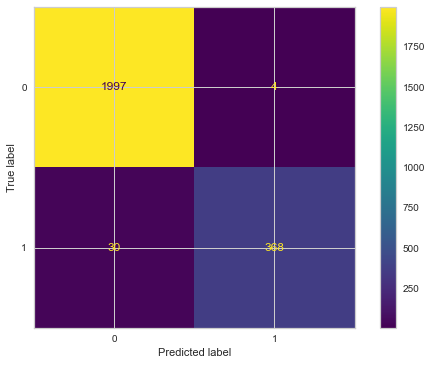

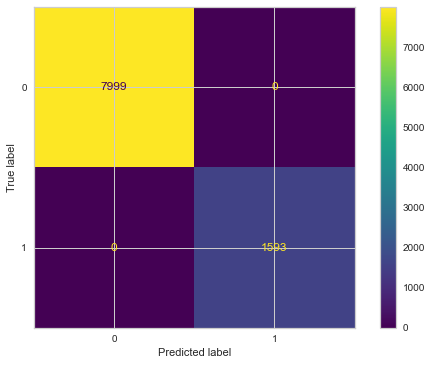

In [132]:
eval_metric(RF_model, X1_train, y1_train, X1_test, y1_test)

### Feature Importance for Random Forest Model 

In [133]:
RF_feature_imp = pd.DataFrame(index=X1.columns, data = RF_model.feature_importances_, columns = ['Importance']).sort_values("Importance", ascending = False)
RF_feature_imp

,Importance
satisfaction_level,0.290
time_spend_company,0.251
average_montly_hours,0.149
number_project,0.141
last_evaluation,0.137
departments,0.016
salary,0.009
work_accident,0.005
promotion_last_5years,0.001


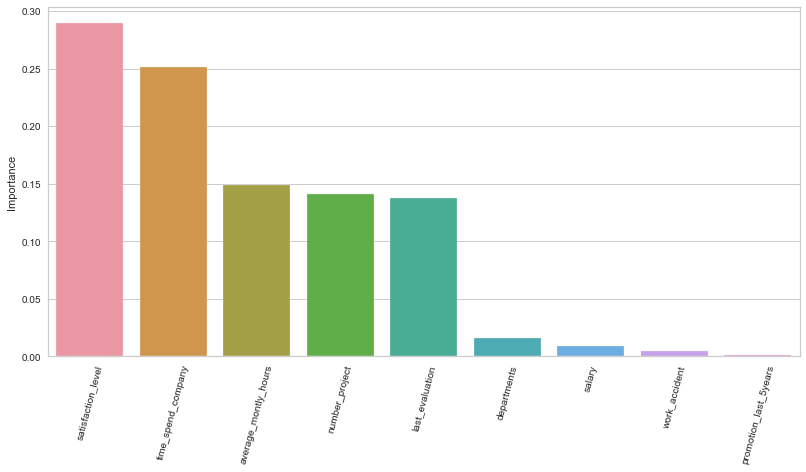

In [134]:
plt.figure(figsize = (12,6))
sns.barplot(data = RF_feature_imp.sort_values('Importance', ascending = False), x = RF_feature_imp.sort_values('Importance', ascending = False).index, y = 'Importance')
plt.xticks(rotation = 75);

#### Random Forest Classifier Cross Validation 

In [135]:
RF_cv = RandomForestClassifier(class_weight = "balanced", random_state = 42)

RF_cv_scores = cross_validate(RF_cv, X1_train, y1_train, 
                              scoring = ['accuracy', 'precision','recall', 'f1', 'roc_auc'], cv = 10)
RF_cv_scores = pd.DataFrame(RF_cv_scores, index = range(1, 11))

RF_cv_scores.mean()[2:]

test_accuracy    0.983
test_precision   0.990
test_recall      0.908
test_f1          0.947
test_roc_auc     0.982
dtype: float64

#### Random Forest Classifier GridSearchCV

In [136]:
param_grid = {'n_estimators' : [50, 100, 300],
             'max_features' : [2, 3, 4],
             'max_depth' : [3, 5, 7, 9],
             'min_samples_split' : [2, 5, 8]}

In [137]:
RF_grid = RandomForestClassifier(class_weight = 'balanced', random_state = 42)
RF_grid_model = GridSearchCV(estimator = RF_grid, 
                             param_grid = param_grid, 
                             scoring = "f1", 
                             n_jobs = -1, verbose = 2)
RF_grid_model.fit(X1_train, y1_train)

<IPython.core.display.Javascript object>

Fitting 5 folds for each of 108 candidates, totalling 540 fits


GridSearchCV(estimator=RandomForestClassifier(class_weight='balanced',
                                              random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': [3, 5, 7, 9], 'max_features': [2, 3, 4],
                         'min_samples_split': [2, 5, 8],
                         'n_estimators': [50, 100, 300]},
             scoring='f1', verbose=2)

In [138]:
RF_grid_model.best_estimator_

RandomForestClassifier(class_weight='balanced', max_depth=9, max_features=4,
                       min_samples_split=8, n_estimators=50, random_state=42)

In [139]:
RF_grid_model.best_score_

0.9479645114334874

#### Evaluating Model Performance and Tuning

In [140]:
RF_tuned = RandomForestClassifier(class_weight = 'balanced',
                                  max_depth = 9,
                                  min_samples_split=8,
                                  max_features = 4,
                                  n_estimators = 50,
                                  random_state = 42).fit(X1_train, y1_train)

In [141]:
y_pred = RF_tuned.predict(X1_test)
y_train_pred = RF_tuned.predict(X1_train)

RF_tuned_f1 = f1_score(y1_test, y_pred)
RF_tuned_acc = accuracy_score(y1_test, y_pred)
RF_tuned_recall = recall_score(y1_test, y_pred)
RF_tuned_auc = roc_auc_score(y1_test, y_pred)

TEST REPORT
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2001
           1       0.99      0.92      0.95       398

    accuracy                           0.99      2399
   macro avg       0.99      0.96      0.97      2399
weighted avg       0.99      0.99      0.99      2399




 -*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
TRAIN REPORT
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      7999
           1       0.99      0.94      0.96      1593

    accuracy                           0.99      9592
   macro avg       0.99      0.97      0.98      9592
weighted avg       0.99      0.99      0.99      9592



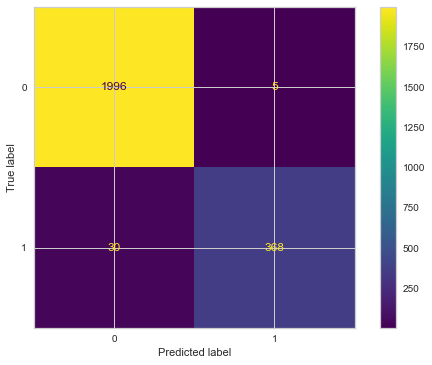

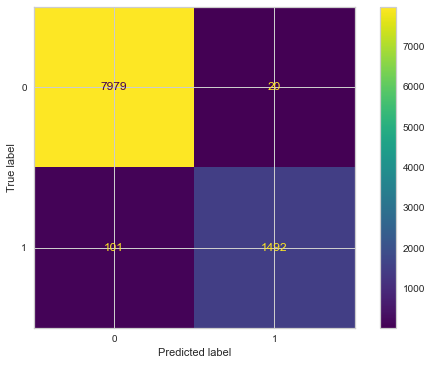

In [142]:
eval_metric(RF_tuned, X1_train, y1_train, X1_test, y1_test)

#### Random Forest Classifier ROC (Receiver Operating Curve) and AUC (Area Under Curve) 

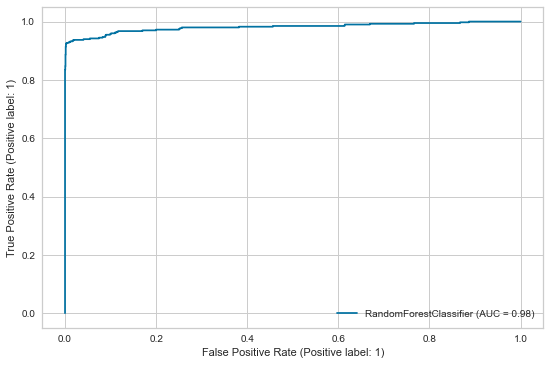

In [143]:
plot_roc_curve(RF_tuned, X1_test, y1_test);

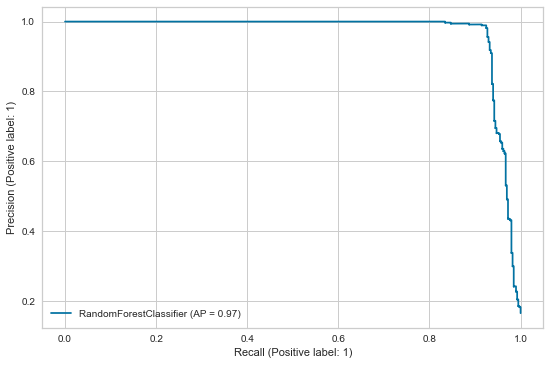

In [144]:
plot_precision_recall_curve(RF_tuned, X1_test, y1_test);

### #ANN Classifier

In [145]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam

#### Layer Architecture Building and Compiling

In [146]:
df1.shape

(11991, 10)

In [147]:
tf.random.set_seed(42)

model = Sequential()

model.add(Dense(32, activation="relu", input_dim = X1_train.shape[1]))
model.add(Dense(16, activation="relu"))
model.add(Dense(8, activation="relu"))
model.add(Dense(1, activation="sigmoid"))

opt = Adam(lr=0.001)
model.compile(optimizer=opt, 
              loss="binary_crossentropy",
              metrics=["Recall"])

In [148]:
class_weights = class_weight.compute_class_weight(
                                        class_weight = "balanced",
                                        classes = np.unique(y1_train),
                                        y=y1_train.values.reshape(-1)
                                    )
class_weights = dict(zip(np.unique(y1_train), class_weights))
class_weights

{0: 0.5995749468683585, 1: 3.01067168863779}

In [149]:
model.fit(x=X1_train,
          y=y1_train,
          validation_split=.1,
          batch_size=64,
          epochs=500,
          verbose=1,
          class_weight=class_weights)

Epoch 1/500
135/135 [==============================] - 1s 2ms/step - loss: 0.6560 - recall: 0.9764 - val_loss: 0.7184 - val_recall: 0.9934
Epoch 2/500
135/135 [==============================] - 0s 1ms/step - loss: 0.5282 - recall: 0.9514 - val_loss: 0.5376 - val_recall: 0.9671
Epoch 3/500
135/135 [==============================] - 0s 1ms/step - loss: 0.3513 - recall: 0.9119 - val_loss: 0.3384 - val_recall: 0.9539
Epoch 4/500
135/135 [==============================] - 0s 1ms/step - loss: 0.2568 - recall: 0.9188 - val_loss: 0.2487 - val_recall: 0.9276
Epoch 5/500
135/135 [==============================] - 0s 1ms/step - loss: 0.2246 - recall: 0.9230 - val_loss: 0.2057 - val_recall: 0.9211
Epoch 6/500
135/135 [==============================] - 0s 1ms/step - loss: 0.2127 - recall: 0.9230 - val_loss: 0.2201 - val_recall: 0.9276
Epoch 7/500
135/135 [==============================] - 0s 1ms/step - loss: 0.2048 - recall: 0.9216 - val_loss: 0.2111 - val_recall: 0.9211
Epoch 8/500
135/135 [======

135/135 [==============================] - 0s 1ms/step - loss: 0.1526 - recall: 0.9278 - val_loss: 0.1445 - val_recall: 0.9145
Epoch 60/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1513 - recall: 0.9278 - val_loss: 0.1410 - val_recall: 0.9145
Epoch 61/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1519 - recall: 0.9285 - val_loss: 0.1697 - val_recall: 0.9145
Epoch 62/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1504 - recall: 0.9313 - val_loss: 0.1493 - val_recall: 0.9211
Epoch 63/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1514 - recall: 0.9264 - val_loss: 0.1341 - val_recall: 0.9145
Epoch 64/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1504 - recall: 0.9292 - val_loss: 0.1597 - val_recall: 0.9079
Epoch 65/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1503 - recall: 0.9306 - val_loss: 0.1359 - val_recall: 0.9079
Epoch 66/500
135/135 [===========

135/135 [==============================] - 0s 1ms/step - loss: 0.1383 - recall: 0.9313 - val_loss: 0.1953 - val_recall: 0.9211
Epoch 118/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1396 - recall: 0.9348 - val_loss: 0.1503 - val_recall: 0.9211
Epoch 119/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1389 - recall: 0.9348 - val_loss: 0.1522 - val_recall: 0.9211
Epoch 120/500
135/135 [==============================] - 0s 999us/step - loss: 0.1405 - recall: 0.9341 - val_loss: 0.1404 - val_recall: 0.9145
Epoch 121/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1392 - recall: 0.9355 - val_loss: 0.1402 - val_recall: 0.9211
Epoch 122/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1395 - recall: 0.9348 - val_loss: 0.1251 - val_recall: 0.9079
Epoch 123/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1396 - recall: 0.9313 - val_loss: 0.1436 - val_recall: 0.9211
Epoch 124/500
135/135 [==

135/135 [==============================] - 0s 1ms/step - loss: 0.1280 - recall: 0.9341 - val_loss: 0.1574 - val_recall: 0.9211
Epoch 176/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1290 - recall: 0.9348 - val_loss: 0.1274 - val_recall: 0.9145
Epoch 177/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1276 - recall: 0.9362 - val_loss: 0.1365 - val_recall: 0.9211
Epoch 178/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1276 - recall: 0.9368 - val_loss: 0.1427 - val_recall: 0.9211
Epoch 179/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1269 - recall: 0.9375 - val_loss: 0.1245 - val_recall: 0.9145
Epoch 180/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1261 - recall: 0.9362 - val_loss: 0.1641 - val_recall: 0.9211
Epoch 181/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1282 - recall: 0.9396 - val_loss: 0.1351 - val_recall: 0.9211
Epoch 182/500
135/135 [====

135/135 [==============================] - 0s 1ms/step - loss: 0.1211 - recall: 0.9396 - val_loss: 0.1185 - val_recall: 0.9145
Epoch 234/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1187 - recall: 0.9368 - val_loss: 0.1492 - val_recall: 0.9342
Epoch 235/500
135/135 [==============================] - 0s 997us/step - loss: 0.1216 - recall: 0.9403 - val_loss: 0.1425 - val_recall: 0.9276
Epoch 236/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1204 - recall: 0.9396 - val_loss: 0.1351 - val_recall: 0.9211
Epoch 237/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1208 - recall: 0.9403 - val_loss: 0.1423 - val_recall: 0.9276
Epoch 238/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1188 - recall: 0.9396 - val_loss: 0.1223 - val_recall: 0.9079
Epoch 239/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1191 - recall: 0.9382 - val_loss: 0.1487 - val_recall: 0.9276
Epoch 240/500
135/135 [==

135/135 [==============================] - 0s 1ms/step - loss: 0.1185 - recall: 0.9389 - val_loss: 0.1271 - val_recall: 0.9211
Epoch 292/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1159 - recall: 0.9396 - val_loss: 0.1423 - val_recall: 0.9342
Epoch 293/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1158 - recall: 0.9452 - val_loss: 0.1174 - val_recall: 0.9211
Epoch 294/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1161 - recall: 0.9410 - val_loss: 0.1317 - val_recall: 0.9145
Epoch 295/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1154 - recall: 0.9431 - val_loss: 0.1306 - val_recall: 0.9145
Epoch 296/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1162 - recall: 0.9403 - val_loss: 0.1226 - val_recall: 0.9211
Epoch 297/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1142 - recall: 0.9452 - val_loss: 0.1284 - val_recall: 0.9211
Epoch 298/500
135/135 [====

135/135 [==============================] - 0s 1ms/step - loss: 0.1087 - recall: 0.9466 - val_loss: 0.1290 - val_recall: 0.9276
Epoch 350/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1091 - recall: 0.9459 - val_loss: 0.1180 - val_recall: 0.9211
Epoch 351/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1093 - recall: 0.9438 - val_loss: 0.1293 - val_recall: 0.9211
Epoch 352/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1093 - recall: 0.9473 - val_loss: 0.1296 - val_recall: 0.9145
Epoch 353/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1087 - recall: 0.9459 - val_loss: 0.1373 - val_recall: 0.9211
Epoch 354/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1097 - recall: 0.9438 - val_loss: 0.1414 - val_recall: 0.9211
Epoch 355/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1117 - recall: 0.9445 - val_loss: 0.1163 - val_recall: 0.9211
Epoch 356/500
135/135 [====

135/135 [==============================] - 0s 996us/step - loss: 0.1054 - recall: 0.9493 - val_loss: 0.1409 - val_recall: 0.9211
Epoch 408/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1035 - recall: 0.9514 - val_loss: 0.1237 - val_recall: 0.9145
Epoch 409/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1050 - recall: 0.9459 - val_loss: 0.1159 - val_recall: 0.9276
Epoch 410/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1037 - recall: 0.9480 - val_loss: 0.1309 - val_recall: 0.9145
Epoch 411/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1062 - recall: 0.9486 - val_loss: 0.1334 - val_recall: 0.9276
Epoch 412/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1051 - recall: 0.9445 - val_loss: 0.1193 - val_recall: 0.9211
Epoch 413/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1081 - recall: 0.9459 - val_loss: 0.1642 - val_recall: 0.9342
Epoch 414/500
135/135 [==

135/135 [==============================] - 0s 1ms/step - loss: 0.0990 - recall: 0.9514 - val_loss: 0.1397 - val_recall: 0.9276
Epoch 466/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1039 - recall: 0.9500 - val_loss: 0.1125 - val_recall: 0.9145
Epoch 467/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1015 - recall: 0.9459 - val_loss: 0.1240 - val_recall: 0.9276
Epoch 468/500
135/135 [==============================] - 0s 1ms/step - loss: 0.0997 - recall: 0.9500 - val_loss: 0.1360 - val_recall: 0.9211
Epoch 469/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1019 - recall: 0.9500 - val_loss: 0.1332 - val_recall: 0.9211
Epoch 470/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1023 - recall: 0.9486 - val_loss: 0.1226 - val_recall: 0.9211
Epoch 471/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1014 - recall: 0.9507 - val_loss: 0.1434 - val_recall: 0.9145
Epoch 472/500
135/135 [====

In [150]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32)                320       
                                                                 
 dense_1 (Dense)             (None, 16)                528       
                                                                 
 dense_2 (Dense)             (None, 8)                 136       
                                                                 
 dense_3 (Dense)             (None, 1)                 9         
                                                                 
Total params: 993
Trainable params: 993
Non-trainable params: 0
_________________________________________________________________


#### Evaluating Model Performance and Tunning

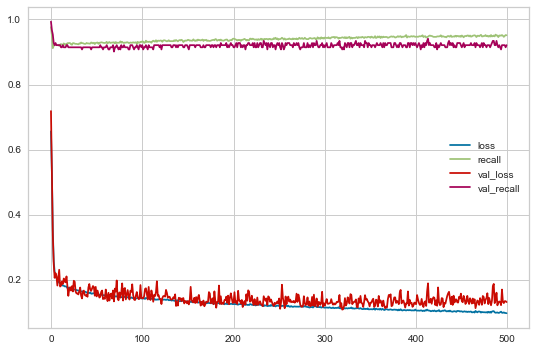

In [151]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot();

In [152]:
y_pred = model.predict(X1_test) > 0.5
print(confusion_matrix(y1_test, y_pred))
print(classification_report(y1_test, y_pred))

75/75 [==============================] - 0s 561us/step
[[1957   44]
 [  33  365]]
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      2001
           1       0.89      0.92      0.90       398

    accuracy                           0.97      2399
   macro avg       0.94      0.95      0.94      2399
weighted avg       0.97      0.97      0.97      2399



### Precision-Recall Curve and AP (Average Precision) for model

75/75 [==============================] - 0s 577us/step


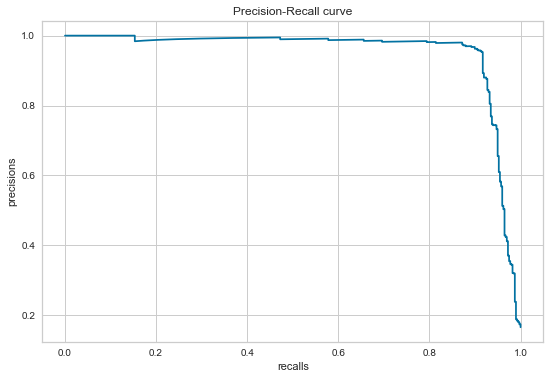

In [153]:
y_pred_proba = model.predict(X1_test)
precisions, recalls, thresholds = precision_recall_curve(y1_test, y_pred_proba)
plt.plot(recalls, precisions, label='ANN')
plt.xlabel('recalls')
plt.ylabel('precisions')
plt.title('Precision-Recall curve')
plt.show()

In [154]:
average_precision_score(y1_test, y_pred_proba)

0.952827827085736

### Increasing Learning Rate and Observing The Results 

In [155]:
tf.random.set_seed(42)

model = Sequential()

model.add(Dense(32, activation="relu", input_dim = X1_train.shape[1]))
model.add(Dense(16, activation="relu"))
model.add(Dense(8, activation="relu"))
model.add(Dense(1, activation="sigmoid"))

opt = Adam(lr=0.005)
model.compile(optimizer=opt, 
              loss="binary_crossentropy",
              metrics=["Recall"])

In [156]:
model.fit(x=X1_train,
          y=y1_train,
          validation_split=.1,
          batch_size=64,
          epochs=500,
          verbose=1,
          class_weight=class_weights)

Epoch 1/500
135/135 [==============================] - 1s 2ms/step - loss: 0.4674 - recall: 0.8668 - val_loss: 0.3050 - val_recall: 0.9342
Epoch 2/500
135/135 [==============================] - 0s 1ms/step - loss: 0.2362 - recall: 0.9202 - val_loss: 0.2315 - val_recall: 0.9211
Epoch 3/500
135/135 [==============================] - 0s 1ms/step - loss: 0.2142 - recall: 0.9202 - val_loss: 0.3219 - val_recall: 0.9276
Epoch 4/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1949 - recall: 0.9237 - val_loss: 0.1801 - val_recall: 0.9211
Epoch 5/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1817 - recall: 0.9209 - val_loss: 0.1739 - val_recall: 0.9211
Epoch 6/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1786 - recall: 0.9251 - val_loss: 0.2306 - val_recall: 0.9211
Epoch 7/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1779 - recall: 0.9223 - val_loss: 0.1835 - val_recall: 0.9211
Epoch 8/500
135/135 [======

135/135 [==============================] - 0s 1ms/step - loss: 0.1251 - recall: 0.9375 - val_loss: 0.1589 - val_recall: 0.9211
Epoch 60/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1161 - recall: 0.9396 - val_loss: 0.1282 - val_recall: 0.9145
Epoch 61/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1119 - recall: 0.9403 - val_loss: 0.1328 - val_recall: 0.9145
Epoch 62/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1170 - recall: 0.9389 - val_loss: 0.1293 - val_recall: 0.9145
Epoch 63/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1157 - recall: 0.9403 - val_loss: 0.1208 - val_recall: 0.9145
Epoch 64/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1150 - recall: 0.9389 - val_loss: 0.1462 - val_recall: 0.9145
Epoch 65/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1145 - recall: 0.9424 - val_loss: 0.1220 - val_recall: 0.9211
Epoch 66/500
135/135 [===========

135/135 [==============================] - 0s 1ms/step - loss: 0.0852 - recall: 0.9528 - val_loss: 0.1760 - val_recall: 0.9211
Epoch 118/500
135/135 [==============================] - 0s 1ms/step - loss: 0.0883 - recall: 0.9563 - val_loss: 0.2065 - val_recall: 0.9145
Epoch 119/500
135/135 [==============================] - 0s 1ms/step - loss: 0.0861 - recall: 0.9563 - val_loss: 0.1569 - val_recall: 0.9211
Epoch 120/500
135/135 [==============================] - 0s 1ms/step - loss: 0.0831 - recall: 0.9542 - val_loss: 0.1459 - val_recall: 0.9013
Epoch 121/500
135/135 [==============================] - 0s 1ms/step - loss: 0.0809 - recall: 0.9570 - val_loss: 0.1476 - val_recall: 0.9079
Epoch 122/500
135/135 [==============================] - 0s 1ms/step - loss: 0.0828 - recall: 0.9563 - val_loss: 0.1483 - val_recall: 0.9079
Epoch 123/500
135/135 [==============================] - 0s 1ms/step - loss: 0.0839 - recall: 0.9535 - val_loss: 0.1493 - val_recall: 0.9079
Epoch 124/500
135/135 [====

135/135 [==============================] - 0s 1ms/step - loss: 0.0723 - recall: 0.9667 - val_loss: 0.1809 - val_recall: 0.9079
Epoch 176/500
135/135 [==============================] - 0s 1ms/step - loss: 0.0664 - recall: 0.9709 - val_loss: 0.1775 - val_recall: 0.9145
Epoch 177/500
135/135 [==============================] - 0s 1ms/step - loss: 0.0659 - recall: 0.9702 - val_loss: 0.1995 - val_recall: 0.9276
Epoch 178/500
135/135 [==============================] - 0s 1ms/step - loss: 0.0689 - recall: 0.9736 - val_loss: 0.1787 - val_recall: 0.9211
Epoch 179/500
135/135 [==============================] - 0s 1ms/step - loss: 0.0678 - recall: 0.9695 - val_loss: 0.1897 - val_recall: 0.9013
Epoch 180/500
135/135 [==============================] - 0s 1ms/step - loss: 0.0657 - recall: 0.9736 - val_loss: 0.2063 - val_recall: 0.9276
Epoch 181/500
135/135 [==============================] - 0s 1ms/step - loss: 0.0632 - recall: 0.9709 - val_loss: 0.1879 - val_recall: 0.9145
Epoch 182/500
135/135 [====

135/135 [==============================] - 0s 1ms/step - loss: 0.0606 - recall: 0.9764 - val_loss: 0.1897 - val_recall: 0.9013
Epoch 234/500
135/135 [==============================] - 0s 1ms/step - loss: 0.0649 - recall: 0.9757 - val_loss: 0.2232 - val_recall: 0.9276
Epoch 235/500
135/135 [==============================] - 0s 1ms/step - loss: 0.0570 - recall: 0.9778 - val_loss: 0.2186 - val_recall: 0.8947
Epoch 236/500
135/135 [==============================] - 0s 1ms/step - loss: 0.0625 - recall: 0.9729 - val_loss: 0.2155 - val_recall: 0.9211
Epoch 237/500
135/135 [==============================] - 0s 1ms/step - loss: 0.0523 - recall: 0.9785 - val_loss: 0.2043 - val_recall: 0.9276
Epoch 238/500
135/135 [==============================] - 0s 1ms/step - loss: 0.0524 - recall: 0.9750 - val_loss: 0.2109 - val_recall: 0.9211
Epoch 239/500
135/135 [==============================] - 0s 1ms/step - loss: 0.0542 - recall: 0.9799 - val_loss: 0.2105 - val_recall: 0.9145
Epoch 240/500
135/135 [====

135/135 [==============================] - 0s 1ms/step - loss: 0.0533 - recall: 0.9764 - val_loss: 0.2380 - val_recall: 0.9013
Epoch 292/500
135/135 [==============================] - 0s 1ms/step - loss: 0.0784 - recall: 0.9764 - val_loss: 0.2070 - val_recall: 0.9342
Epoch 293/500
135/135 [==============================] - 0s 1ms/step - loss: 0.0469 - recall: 0.9833 - val_loss: 0.2119 - val_recall: 0.9145
Epoch 294/500
135/135 [==============================] - 0s 994us/step - loss: 0.0416 - recall: 0.9840 - val_loss: 0.2226 - val_recall: 0.9211
Epoch 295/500
135/135 [==============================] - 0s 997us/step - loss: 0.0476 - recall: 0.9847 - val_loss: 0.2332 - val_recall: 0.9211
Epoch 296/500
135/135 [==============================] - 0s 997us/step - loss: 0.0514 - recall: 0.9792 - val_loss: 0.2108 - val_recall: 0.9145
Epoch 297/500
135/135 [==============================] - 0s 999us/step - loss: 0.0522 - recall: 0.9820 - val_loss: 0.2139 - val_recall: 0.9145
Epoch 298/500
135/1

135/135 [==============================] - 0s 1ms/step - loss: 0.0443 - recall: 0.9868 - val_loss: 0.2350 - val_recall: 0.9079
Epoch 350/500
135/135 [==============================] - 0s 998us/step - loss: 0.0413 - recall: 0.9882 - val_loss: 0.2806 - val_recall: 0.9145
Epoch 351/500
135/135 [==============================] - 0s 1ms/step - loss: 0.0529 - recall: 0.9813 - val_loss: 0.2813 - val_recall: 0.9079
Epoch 352/500
135/135 [==============================] - 0s 1ms/step - loss: 0.0479 - recall: 0.9820 - val_loss: 0.2603 - val_recall: 0.9013
Epoch 353/500
135/135 [==============================] - 0s 1ms/step - loss: 0.0445 - recall: 0.9833 - val_loss: 0.2747 - val_recall: 0.9276
Epoch 354/500
135/135 [==============================] - 0s 1ms/step - loss: 0.0427 - recall: 0.9847 - val_loss: 0.2821 - val_recall: 0.9145
Epoch 355/500
135/135 [==============================] - 0s 1ms/step - loss: 0.0490 - recall: 0.9861 - val_loss: 0.2723 - val_recall: 0.9013
Epoch 356/500
135/135 [==

135/135 [==============================] - 0s 1ms/step - loss: 0.0400 - recall: 0.9875 - val_loss: 0.3022 - val_recall: 0.9013
Epoch 408/500
135/135 [==============================] - 0s 1ms/step - loss: 0.0536 - recall: 0.9847 - val_loss: 0.2786 - val_recall: 0.9145
Epoch 409/500
135/135 [==============================] - 0s 1ms/step - loss: 0.0396 - recall: 0.9882 - val_loss: 0.2803 - val_recall: 0.8947
Epoch 410/500
135/135 [==============================] - 0s 1ms/step - loss: 0.0346 - recall: 0.9896 - val_loss: 0.2612 - val_recall: 0.9079
Epoch 411/500
135/135 [==============================] - 0s 1ms/step - loss: 0.0366 - recall: 0.9896 - val_loss: 0.2740 - val_recall: 0.9145
Epoch 412/500
135/135 [==============================] - 0s 1ms/step - loss: 0.0407 - recall: 0.9910 - val_loss: 0.2688 - val_recall: 0.9013
Epoch 413/500
135/135 [==============================] - 0s 1ms/step - loss: 0.0412 - recall: 0.9840 - val_loss: 0.3015 - val_recall: 0.9211
Epoch 414/500
135/135 [====

135/135 [==============================] - 0s 1ms/step - loss: 0.0306 - recall: 0.9944 - val_loss: 0.3207 - val_recall: 0.9013
Epoch 466/500
135/135 [==============================] - 0s 1ms/step - loss: 0.0296 - recall: 0.9944 - val_loss: 0.3040 - val_recall: 0.9013
Epoch 467/500
135/135 [==============================] - 0s 1ms/step - loss: 0.0429 - recall: 0.9875 - val_loss: 0.3451 - val_recall: 0.9211
Epoch 468/500
135/135 [==============================] - 0s 1ms/step - loss: 0.0645 - recall: 0.9813 - val_loss: 0.3033 - val_recall: 0.9079
Epoch 469/500
135/135 [==============================] - 0s 1ms/step - loss: 0.0365 - recall: 0.9889 - val_loss: 0.3183 - val_recall: 0.9079
Epoch 470/500
135/135 [==============================] - 0s 1ms/step - loss: 0.0281 - recall: 0.9924 - val_loss: 0.3362 - val_recall: 0.9079
Epoch 471/500
135/135 [==============================] - 0s 1ms/step - loss: 0.0428 - recall: 0.9861 - val_loss: 0.3183 - val_recall: 0.9145
Epoch 472/500
135/135 [====

In [157]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 32)                320       
                                                                 
 dense_5 (Dense)             (None, 16)                528       
                                                                 
 dense_6 (Dense)             (None, 8)                 136       
                                                                 
 dense_7 (Dense)             (None, 1)                 9         
                                                                 
Total params: 993
Trainable params: 993
Non-trainable params: 0
_________________________________________________________________


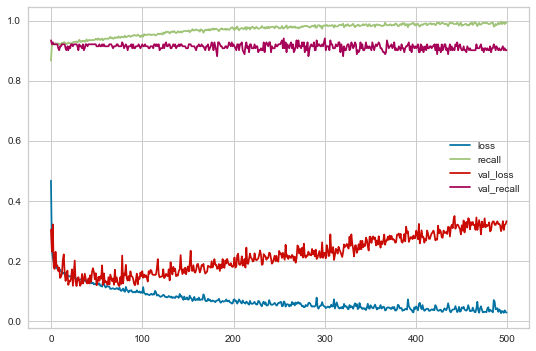

In [158]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot();

In [159]:
y_pred = model.predict(X1_test) > 0.5
print(confusion_matrix(y1_test, y_pred))
print(classification_report(y1_test, y_pred))

75/75 [==============================] - 0s 643us/step
[[1944   57]
 [  28  370]]
              precision    recall  f1-score   support

           0       0.99      0.97      0.98      2001
           1       0.87      0.93      0.90       398

    accuracy                           0.96      2399
   macro avg       0.93      0.95      0.94      2399
weighted avg       0.97      0.96      0.97      2399



###  Adding Early Stop & Dropout Layer

In [160]:
tf.random.set_seed(42)

model = Sequential()

model.add(Dense(32, activation="relu", input_dim = X1_train.shape[1]))
model.add(Dropout(0.2))
model.add(Dense(16, activation="relu"))
model.add(Dropout(0.2))
model.add(Dense(8, activation="relu"))
model.add(Dropout(0.2))
model.add(Dense(1, activation="sigmoid"))

opt = Adam(lr=0.001)
model.compile(optimizer=opt, 
              loss="binary_crossentropy",
              metrics=["Recall"])

In [161]:
early_stop = EarlyStopping(monitor="val_loss",
                           mode="min",
                           verbose=1,
                           patience=25,
                           restore_best_weights = True)

In [162]:
model.fit(x=X1_train,
          y=y1_train,
          validation_split=.1,
          batch_size=64,
          epochs=500,
          verbose=1,
          callbacks=[early_stop],
          class_weight=class_weights)

Epoch 1/500
135/135 [==============================] - 1s 2ms/step - loss: 0.6815 - recall: 0.4296 - val_loss: 0.6271 - val_recall: 0.7500
Epoch 2/500
135/135 [==============================] - 0s 1ms/step - loss: 0.6248 - recall: 0.6426 - val_loss: 0.5360 - val_recall: 0.9013
Epoch 3/500
135/135 [==============================] - 0s 2ms/step - loss: 0.5401 - recall: 0.7710 - val_loss: 0.4197 - val_recall: 0.9276
Epoch 4/500
135/135 [==============================] - 0s 1ms/step - loss: 0.4585 - recall: 0.8501 - val_loss: 0.3548 - val_recall: 0.9408
Epoch 5/500
135/135 [==============================] - 0s 1ms/step - loss: 0.3973 - recall: 0.8633 - val_loss: 0.3384 - val_recall: 0.9408
Epoch 6/500
135/135 [==============================] - 0s 1ms/step - loss: 0.3569 - recall: 0.8924 - val_loss: 0.2771 - val_recall: 0.9342
Epoch 7/500
135/135 [==============================] - 0s 1ms/step - loss: 0.3289 - recall: 0.8980 - val_loss: 0.2806 - val_recall: 0.9145
Epoch 8/500
135/135 [======

135/135 [==============================] - 0s 1ms/step - loss: 0.1888 - recall: 0.9167 - val_loss: 0.1716 - val_recall: 0.9145
Epoch 60/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1923 - recall: 0.9133 - val_loss: 0.1556 - val_recall: 0.9145
Epoch 61/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1914 - recall: 0.9188 - val_loss: 0.1625 - val_recall: 0.9145
Epoch 62/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1870 - recall: 0.9119 - val_loss: 0.1682 - val_recall: 0.9145
Epoch 63/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1955 - recall: 0.9146 - val_loss: 0.1498 - val_recall: 0.9145
Epoch 64/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1894 - recall: 0.9216 - val_loss: 0.1663 - val_recall: 0.9145
Epoch 65/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1886 - recall: 0.9146 - val_loss: 0.1616 - val_recall: 0.9145
Epoch 66/500
135/135 [===========

135/135 [==============================] - 0s 1ms/step - loss: 0.1717 - recall: 0.9223 - val_loss: 0.1367 - val_recall: 0.9211
Epoch 118/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1764 - recall: 0.9153 - val_loss: 0.1533 - val_recall: 0.9145
Epoch 119/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1778 - recall: 0.9112 - val_loss: 0.1334 - val_recall: 0.9145
Epoch 120/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1740 - recall: 0.9230 - val_loss: 0.1456 - val_recall: 0.9145
Epoch 121/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1768 - recall: 0.9167 - val_loss: 0.1545 - val_recall: 0.9145
Epoch 122/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1682 - recall: 0.9195 - val_loss: 0.1424 - val_recall: 0.9211
Epoch 123/500
135/135 [==============================] - 0s 1ms/step - loss: 0.1786 - recall: 0.9188 - val_loss: 0.1340 - val_recall: 0.9145
Epoch 124/500
135/135 [====

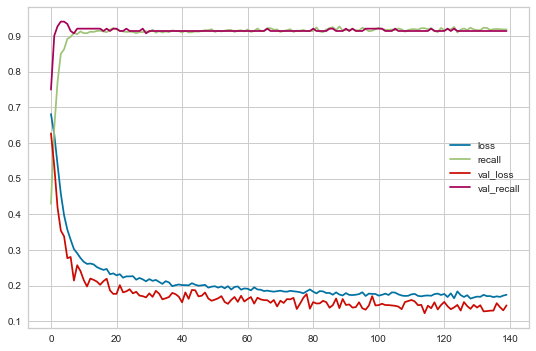

In [163]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot();

In [164]:
y_pred = model.predict(X1_test) > 0.5
print(confusion_matrix(y1_test, y_pred))
print(classification_report(y1_test, y_pred))

75/75 [==============================] - 0s 585us/step
[[1961   40]
 [  32  366]]
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      2001
           1       0.90      0.92      0.91       398

    accuracy                           0.97      2399
   macro avg       0.94      0.95      0.95      2399
weighted avg       0.97      0.97      0.97      2399



### GridSearchCV

In [165]:
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier
from tensorflow.keras.optimizers import Adam, Adadelta, RMSprop, Nadam

In [166]:
def build_classifier(optimizer, learn_rate):
    classifier = Sequential()
    classifier.add(Dense(units = 32, activation = 'relu'))
    classifier.add(Dropout(0.2))
    classifier.add(Dense(units = 16, activation = 'relu'))
    classifier.add(Dropout(0.2))
    classifier.add(Dense(units = 8, activation = 'relu'))
    classifier.add(Dropout(0.2))
    classifier.add(Dense(units = 1, activation = 'sigmoid'))
    classifier.compile(optimizer = optimizer(learn_rate), loss = 'binary_crossentropy', metrics = ['Recall'])
    return classifier

In [167]:
class_weights

{0: 0.5995749468683585, 1: 3.01067168863779}

In [168]:
early_stop = EarlyStopping(monitor="val_loss",
                           mode="min",
                           verbose=1,
                           patience=15,
                           restore_best_weights = True)

In [169]:
tf.random.set_seed(42)
classifier = KerasClassifier(build_fn=build_classifier, validation_split = 0.1, epochs=500)

parameters = {'batch_size': [64, 128, 256],
              'optimizer': [Adam, RMSprop, Adadelta, Nadam],
              'learn_rate': [0.001, 0.003, 0.005]}

grid_model = GridSearchCV(estimator=classifier,
                          param_grid=parameters,
                          scoring='recall',
                          cv=5,
                          n_jobs=-1,
                          verbose=1)

grid_model.fit(X1_train, y1_train, callbacks = [early_stop], class_weight=class_weights)

<IPython.core.display.Javascript object>

Fitting 5 folds for each of 36 candidates, totalling 180 fits
Epoch 1/500
34/34 [==============================] - 1s 6ms/step - loss: 0.6995 - recall: 0.1055 - val_loss: 0.6476 - val_recall: 0.0066
Epoch 2/500
34/34 [==============================] - 0s 2ms/step - loss: 0.6854 - recall: 0.2894 - val_loss: 0.6301 - val_recall: 0.2039
Epoch 3/500
34/34 [==============================] - 0s 2ms/step - loss: 0.6682 - recall: 0.4316 - val_loss: 0.5979 - val_recall: 0.2829
Epoch 4/500
34/34 [==============================] - 0s 2ms/step - loss: 0.6381 - recall: 0.5947 - val_loss: 0.5938 - val_recall: 0.8618
Epoch 5/500
34/34 [==============================] - 0s 2ms/step - loss: 0.6171 - recall: 0.6877 - val_loss: 0.5786 - val_recall: 0.9276
Epoch 6/500
34/34 [==============================] - 0s 2ms/step - loss: 0.5825 - recall: 0.7661 - val_loss: 0.5592 - val_recall: 0.9342
Epoch 7/500
34/34 [==============================] - 0s 2ms/step - loss: 0.5468 - recall: 0.8105 - val_loss: 0.4848 

Epoch 60/500
34/34 [==============================] - 0s 2ms/step - loss: 0.2067 - recall: 0.9091 - val_loss: 0.1741 - val_recall: 0.9145
Epoch 61/500
34/34 [==============================] - 0s 2ms/step - loss: 0.2118 - recall: 0.9077 - val_loss: 0.1782 - val_recall: 0.9145
Epoch 62/500
34/34 [==============================] - 0s 2ms/step - loss: 0.2147 - recall: 0.9077 - val_loss: 0.1740 - val_recall: 0.9145
Epoch 63/500
34/34 [==============================] - 0s 2ms/step - loss: 0.2105 - recall: 0.9077 - val_loss: 0.1721 - val_recall: 0.9145
Epoch 64/500
34/34 [==============================] - 0s 2ms/step - loss: 0.2149 - recall: 0.9077 - val_loss: 0.1766 - val_recall: 0.9145
Epoch 65/500
34/34 [==============================] - 0s 2ms/step - loss: 0.2015 - recall: 0.9139 - val_loss: 0.1726 - val_recall: 0.9145
Epoch 66/500
34/34 [==============================] - 0s 2ms/step - loss: 0.2066 - recall: 0.9112 - val_loss: 0.1787 - val_recall: 0.9145
Epoch 67/500
34/34 [==============

34/34 [==============================] - 0s 2ms/step - loss: 0.1845 - recall: 0.9133 - val_loss: 0.1510 - val_recall: 0.9145
Epoch 120/500
34/34 [==============================] - 0s 2ms/step - loss: 0.1809 - recall: 0.9139 - val_loss: 0.1505 - val_recall: 0.9145
Epoch 121/500
34/34 [==============================] - 0s 2ms/step - loss: 0.1811 - recall: 0.9091 - val_loss: 0.1428 - val_recall: 0.9145
Epoch 122/500
34/34 [==============================] - 0s 2ms/step - loss: 0.1784 - recall: 0.9063 - val_loss: 0.1470 - val_recall: 0.9145
Epoch 123/500
34/34 [==============================] - 0s 2ms/step - loss: 0.1816 - recall: 0.9160 - val_loss: 0.1506 - val_recall: 0.9145
Epoch 123: early stopping


GridSearchCV(cv=5,
             estimator=<keras.wrappers.scikit_learn.KerasClassifier object at 0x0000021A671863D0>,
             n_jobs=-1,
             param_grid={'batch_size': [64, 128, 256],
                         'learn_rate': [0.001, 0.003, 0.005],
                         'optimizer': [<class 'keras.optimizers.optimizer_v2.adam.Adam'>,
                                       <class 'keras.optimizers.optimizer_v2.rmsprop.RMSprop'>,
                                       <class 'keras.optimizers.optimizer_v2.adadelta.Adadelta'>,
                                       <class 'keras.optimizers.optimizer_v2.nadam.Nadam'>]},
             scoring='recall', verbose=1)

In [170]:
grid_model.best_score_

0.9129584179544106

In [171]:
grid_model.best_params_

{'batch_size': 256,
 'learn_rate': 0.001,
 'optimizer': keras.optimizers.optimizer_v2.nadam.Nadam}

In [172]:
y_pred = grid_model.predict(X1_test)
print(confusion_matrix(y1_test, y_pred))
print(classification_report(y1_test, y_pred))

75/75 [==============================] - 0s 574us/step
[[1956   45]
 [  31  367]]
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      2001
           1       0.89      0.92      0.91       398

    accuracy                           0.97      2399
   macro avg       0.94      0.95      0.94      2399
weighted avg       0.97      0.97      0.97      2399



### Precision-Recall Curve and AP (Average Precision) for grid_model 

75/75 [==============================] - 0s 580us/step


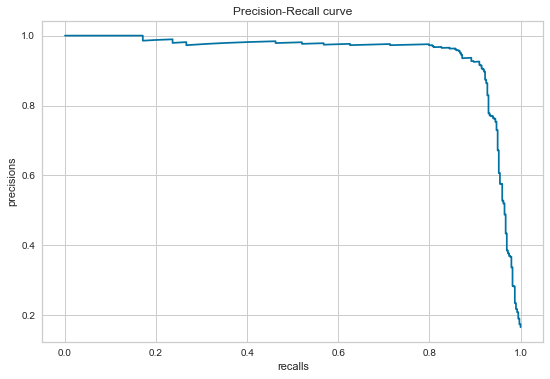

In [173]:
y_pred_proba = grid_model.predict_proba(X1_test)[:, 1]
precisions, recalls, thresholds = precision_recall_curve(y1_test, y_pred_proba)
plt.plot(recalls, precisions, label='ANN')
plt.xlabel('recalls')
plt.ylabel('precisions')
plt.title('Precision-Recall curve')
plt.show()

In [174]:
average_precision_score(y1_test, y_pred_proba)

0.943658220658174

#### Prediction

## 6. Model Deployement

You cooked the food in the kitchen and moved on to the serving stage. The question is how do you showcase your work to others? Model Deployement helps you showcase your work to the world and make better decisions with it. But, deploying a model can get a little tricky at times. Before deploying the model, many things such as data storage, preprocessing, model building and monitoring need to be studied. Streamlit is a popular open source framework used by data scientists for model distribution.

Deployment of machine learning models, means making your models available to your other business systems. By deploying models, other systems can send data to them and get their predictions, which are in turn populated back into the company systems. Through machine learning model deployment, can begin to take full advantage of the model you built.

Data science is concerned with how to build machine learning models, which algorithm is more predictive, how to design features, and what variables to use to make the models more accurate. However, how these models are actually used is often neglected. And yet this is the most important step in the machine learning pipline. Only when a model is fully integrated with the business systems, real values ​​can be extract from its predictions.

After doing the following operations in this notebook, jump to new .py file and create your web app with Streamlit.

### Save and Export the Model

In [196]:
import pickle

In [197]:
xgboost_classifier = pickle.dump(xgb_model_grid, open('xgboost_model', 'wb'))

In [198]:
kneighbors_classifier = pickle.dump(KNN_grid_model, open('kneighbors_model', 'wb'))

In [199]:
random_forest_classifier = pickle.dump(RF_tuned, open('random_forest_model', 'wb'))

In [200]:
ann_classifier = pickle.dump(grid_model, open('ann_model', 'wb'))

INFO:tensorflow:Assets written to: ram://7db9399c-d228-4d94-b6f3-322fb7d30921/assets


### Save and Export Variables


In [193]:
X1.columns

Index(['satisfaction_level', 'last_evaluation', 'number_project',
       'average_montly_hours', 'time_spend_company', 'work_accident',
       'promotion_last_5years', 'departments', 'salary'],
      dtype='object')

In [194]:
col_lst = ['satisfaction_level', 'last_evaluation', 'number_project',
       'average_montly_hours', 'time_spend_company', 'work_accident',
       'promotion_last_5years', 'departments', 'salary']
scaler = MinMaxScaler()
scaler_fitted = scaler.fit(df1[col_lst])
scaler_deploy = pickle.dump(scaler_fitted, open('scaler.sav', 'wb'))

In [179]:
X1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11991 entries, 0 to 11999
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   satisfaction_level     11991 non-null  float64
 1   last_evaluation        11991 non-null  float64
 2   number_project         11991 non-null  int64  
 3   average_montly_hours   11991 non-null  int64  
 4   time_spend_company     11991 non-null  int64  
 5   work_accident          11991 non-null  int64  
 6   promotion_last_5years  11991 non-null  int64  
 7   departments            11991 non-null  int32  
 8   salary                 11991 non-null  int32  
dtypes: float64(2), int32(2), int64(5)
memory usage: 1.1 MB


In [180]:
for col in X1.columns:
    print(col, "min_value:", X1[col].min(), "max_value:", X1[col].max())

satisfaction_level min_value: 0.09 max_value: 1.0
last_evaluation min_value: 0.36 max_value: 1.0
number_project min_value: 2 max_value: 7
average_montly_hours min_value: 96 max_value: 310
time_spend_company min_value: 2 max_value: 10
work_accident min_value: 0 max_value: 1
promotion_last_5years min_value: 0 max_value: 1
departments min_value: 0 max_value: 9
salary min_value: 0 max_value: 2


___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___